# Agenda

1. __Imports:__ This will focus on importing all necessary data and modules
1. __Data Assessing:__ The focus is to familiarize with the data and assess the state of data.
1. __Questions:__ This is were we solve the questions.

# 1)  Imports

##  Modules Import

In [1]:
import re
from typing import List, Dict

import pandas as pd
import numpy as np
import math 

import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud

from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
from prophet import Prophet

from sklearn.decomposition import PCA

/Users/i0557807/opt/anaconda3/envs/ds/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Importing plotly failed. Interactive plots will not work.


##  Data Import

In [2]:
df = pd.read_csv("transactions.csv")
df.head(3)

,TRANSACTION_DATE,CLIENT_ID,TRANSACTION_ID,PRODUCT_ID,PRODUCT_NAME,PRICE_VAT,QUANTITY,CLIENT_TYPE,PRODUCT_CATEGORY
0,2024-06-28,f218bbcf08,576a451c59,fc56dbc6d4,"""CIGARE"" HOEGAARDEN BLANCHE IFK",3.44,19.0,Bar Restaurant,Biere
1,2024-06-28,f218bbcf08,576a451c59,fa2b7af0a8,""" CIGARE"" ABBAYE LEFFE BLDE IFK",4.22,22.0,Bar Restaurant,Biere
2,2024-06-28,f218bbcf08,576a451c59,a9b9bd8e0e,DOM. COUSSIN ROSE 23 CROIX PRIEUR,7.00,5.0,Bar Restaurant,Vins


# 2)  Data Assessing

> Here we will do all the preliminary tests before going into answering the questions.

> This will give us a better idea of the data.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131994 entries, 0 to 131993
Data columns (total 9 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   TRANSACTION_DATE  131994 non-null  object 
 1   CLIENT_ID         131994 non-null  object 
 2   TRANSACTION_ID    131994 non-null  object 
 3   PRODUCT_ID        131994 non-null  object 
 4   PRODUCT_NAME      131994 non-null  object 
 5   PRICE_VAT         131994 non-null  float64
 6   QUANTITY          131994 non-null  float64
 7   CLIENT_TYPE       131994 non-null  object 
 8   PRODUCT_CATEGORY  131806 non-null  object 
dtypes: float64(2), object(7)
memory usage: 9.1+ MB


In [4]:
#check duplicates
df[df.duplicated()]

,TRANSACTION_DATE,CLIENT_ID,TRANSACTION_ID,PRODUCT_ID,PRODUCT_NAME,PRICE_VAT,QUANTITY,CLIENT_TYPE,PRODUCT_CATEGORY
9969,2024-05-07,2ade72cd8e,6a0901bf98,1be0034108,ABATILLES PLATE,0.00,11.0,Divers,Eaux
19608,2024-03-01,a8702afba2,5834dd7fe1,4621c1d55f,CHT DE TESTE BLC TRADITION,0.00,1.0,Divers,Vins
62005,2023-05-15,81c0579ed9,43cc6fa752,0f8ef3377b,ABATILLES PETILLANTE,0.00,26.0,Bar de jour,Eaux
77020,2022-12-15,12598b2446,7051d7025a,6b51d431df,SCHWEPPES INDIAN TONIC,0.00,6.0,Divers,Soda
112538,2022-05-31,8679fa72f2,2635dd5fbf,1be0034108,ABATILLES PLATE,0.00,12.0,Bar Restaurant,Eaux
113868,2022-05-24,806c9f4425,391ff1792d,1be0034108,ABATILLES PLATE,0.00,11.0,Hôtellerie,Eaux
114112,2022-05-24,2ade72cd8e,5a3418f0b8,0f8ef3377b,ABATILLES PETILLANTE,0.00,12.0,Divers,Eaux
115940,2022-05-17,c60b596f10,cf46ece3e3,0f8ef3377b,ABATILLES PETILLANTE,0.00,12.0,Divers,Eaux
117712,2022-05-09,f3987f4a39,019d1ebe8d,0f8ef3377b,ABATILLES PETILLANTE,0.00,12.0,Bar de jour,Eaux
122811,2022-04-13,0c94e62218,2467cd2e05,03a3d955b8,TURSAN ROSE CUVEE IMPERATRICE,0.00,1.0,Restaurant,Vins


In [5]:
#drop duplicates
df = df.drop_duplicates(keep='first')

In [6]:
# Lowering the names of cols for easy of use
df.columns = [x.lower() for x in df.columns.tolist()]

In [7]:
#Transforming transaction_date to date type
df.transaction_date = pd.to_datetime(df['transaction_date'])

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 131982 entries, 0 to 131993
Data columns (total 9 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   transaction_date  131982 non-null  datetime64[ns]
 1   client_id         131982 non-null  object        
 2   transaction_id    131982 non-null  object        
 3   product_id        131982 non-null  object        
 4   product_name      131982 non-null  object        
 5   price_vat         131982 non-null  float64       
 6   quantity          131982 non-null  float64       
 7   client_type       131982 non-null  object        
 8   product_category  131794 non-null  object        
dtypes: datetime64[ns](1), float64(2), object(6)
memory usage: 10.1+ MB


In [9]:
for col in df.columns:
  print(col, "."*(20-len(col)), df[col].unique().tolist()[:20])

transaction_date .... [Timestamp('2024-06-28 00:00:00'), Timestamp('2024-06-27 00:00:00'), Timestamp('2024-06-26 00:00:00'), Timestamp('2024-06-25 00:00:00'), Timestamp('2024-06-24 00:00:00'), Timestamp('2024-06-21 00:00:00'), Timestamp('2024-06-20 00:00:00'), Timestamp('2024-06-19 00:00:00'), Timestamp('2024-06-18 00:00:00'), Timestamp('2024-06-17 00:00:00'), Timestamp('2024-06-14 00:00:00'), Timestamp('2024-06-13 00:00:00'), Timestamp('2024-06-12 00:00:00'), Timestamp('2024-06-11 00:00:00'), Timestamp('2024-06-10 00:00:00'), Timestamp('2024-06-08 00:00:00'), Timestamp('2024-06-07 00:00:00'), Timestamp('2024-06-06 00:00:00'), Timestamp('2024-06-05 00:00:00'), Timestamp('2024-06-04 00:00:00')]
client_id ........... ['f218bbcf08', 'cb6df13f84', 'c60b596f10', 'c228c9296b', 'bf5165a7ec', 'b2f2855cfb', 'b16c034186', 'b099bf3f9c', 'ac75dbd414', 'ac4e6a7900', 'a8702afba2', '9bb510c47c', '9712c3d938', '939af9899d', '8f85d410a6', '8e1b756431', '8714e4ceef', '8679fa72f2', '81e5cc7ce6', '81c0579

## 1) Missing Values

In [10]:
for col in df.columns.tolist():
  if df[col].isna().any():
    print(col)

product_category


> Only Product category has missing rows... lets check

In [11]:
df[df.product_category.isna()]

,transaction_date,client_id,transaction_id,product_id,product_name,price_vat,quantity,client_type,product_category
211,2024-06-28,6967d539fa,8d5b1aac75,9f1f9dce31,CAISSE_ REPRISE VERRE PERDU,0.0,4.0,Restaurant,NaN
276,2024-06-28,305be2aa6f,b74e558f33,9f1f9dce31,CAISSE_ REPRISE VERRE PERDU,0.0,20.0,Bar Restaurant,NaN
1013,2024-06-26,46673885c3,732f5e806d,9f1f9dce31,CAISSE_ REPRISE VERRE PERDU,0.0,3.0,Restaurant,NaN
1524,2024-06-24,305be2aa6f,6ed55a72f5,9f1f9dce31,CAISSE_ REPRISE VERRE PERDU,0.0,15.0,Bar Restaurant,NaN
1741,2024-06-21,305be2aa6f,08e65b6fe2,9f1f9dce31,CAISSE_ REPRISE VERRE PERDU,0.0,5.0,Bar Restaurant,NaN
...,...,...,...,...,...,...,...,...,...
129954,2022-02-09,0180a6384d,3e87b37559,9f1f9dce31,CAISSE_ REPRISE VERRE PERDU,0.0,2.0,Restaurant,NaN
130800,2022-01-26,46673885c3,271bc3bcf0,9f1f9dce31,CAISSE_ REPRISE VERRE PERDU,0.0,4.0,Restaurant,NaN
131266,2022-01-19,0180a6384d,919577e59a,9f1f9dce31,CAISSE_ REPRISE VERRE PERDU,0.0,1.0,Restaurant,NaN
131445,2022-01-13,bfcb16ab86,7f89836f60,9f1f9dce31,CAISSE_ REPRISE VERRE PERDU,0.0,2.0,Bar de jour,NaN


In [12]:
# Is there a reason to be missing? maybe they dont have a product category? 
# what are the client types  when product_category is missing?  
for col in df.columns:
  print(col, "."*(20-len(col)), df[df.product_category.isna()][col].unique().tolist()[:10])

transaction_date .... [Timestamp('2024-06-28 00:00:00'), Timestamp('2024-06-26 00:00:00'), Timestamp('2024-06-24 00:00:00'), Timestamp('2024-06-21 00:00:00'), Timestamp('2024-06-19 00:00:00'), Timestamp('2024-06-17 00:00:00'), Timestamp('2024-06-14 00:00:00'), Timestamp('2024-06-12 00:00:00'), Timestamp('2024-06-10 00:00:00'), Timestamp('2024-06-07 00:00:00')]
client_id ........... ['6967d539fa', '305be2aa6f', '46673885c3', 'ba77ad2323', '50c2d7042b', '339bc58604', '0180a6384d', 'bfcb16ab86']
transaction_id ...... ['8d5b1aac75', 'b74e558f33', '732f5e806d', '6ed55a72f5', '08e65b6fe2', '501ae0d7fb', 'ec19629797', 'b4a860b834', '528472dab9', 'c29c86e6f5']
product_id .......... ['9f1f9dce31']
product_name ........ ['CAISSE_ REPRISE VERRE PERDU']
price_vat ........... [0.0]
quantity ............ [4.0, 20.0, 3.0, 15.0, 5.0, 2.0, 11.0, 10.0, 8.0, 21.0]
client_type ......... ['Restaurant', 'Bar Restaurant', 'Bar de jour']
product_category .... [nan]


> Comment: Seems like this is a state and is only when the product_name is 'CAISSE_ REPRISE VERRE PERDU' that we have product category missing.

> There is no Price only Quantity... This information does not help us so lets filter it out

In [13]:
df = df[df.product_category.isna() == False]

## 2) EDA (one variable at time)
We will focus ONLY in the variable not the interaction/effect with other variables.

In [14]:
# Show unique values per column (only 10)
for col in df.columns:
  print(col, "."*(20-len(col)), df[col].unique().tolist()[:10])

transaction_date .... [Timestamp('2024-06-28 00:00:00'), Timestamp('2024-06-27 00:00:00'), Timestamp('2024-06-26 00:00:00'), Timestamp('2024-06-25 00:00:00'), Timestamp('2024-06-24 00:00:00'), Timestamp('2024-06-21 00:00:00'), Timestamp('2024-06-20 00:00:00'), Timestamp('2024-06-19 00:00:00'), Timestamp('2024-06-18 00:00:00'), Timestamp('2024-06-17 00:00:00')]
client_id ........... ['f218bbcf08', 'cb6df13f84', 'c60b596f10', 'c228c9296b', 'bf5165a7ec', 'b2f2855cfb', 'b16c034186', 'b099bf3f9c', 'ac75dbd414', 'ac4e6a7900']
transaction_id ...... ['576a451c59', '6d77640593', '17d885a6cc', '65fc2a3059', '981b9c4637', '2d2c8a3677', 'a7361ebf0f', '8cf8a1c1b0', 'b2d8f347ab', 'dbefd7aad4']
product_id .......... ['fc56dbc6d4', 'fa2b7af0a8', 'a9b9bd8e0e', '8bcbb4c131', 'e3f6959781', 'a2075145d3', '98f1f17f9a', '97a6d21df7', '7b1a278f5a', '785f3ec7eb']
product_name ........ ['"CIGARE" HOEGAARDEN BLANCHE IFK', '" CIGARE" ABBAYE LEFFE BLDE IFK', 'DOM. COUSSIN ROSE 23 CROIX PRIEUR', 'PUR GRIS ROSE VDP

In [15]:
# Show unique values per column (only 10)
time_cols = ['transaction_date']
numeric_cols = ['price_vat', 'quantity']
cat_cols =['client_id', 'transaction_id', 'product_id','product_name', 'client_type', 'product_category']


In [16]:
print(f'There are {df.client_id.nunique()} unique clients, with {df.product_id.nunique()} unique products, within {df.product_category.nunique()} categories, for a total of {df.transaction_id.nunique()} transactions')

There are 275 unique clients, with 1814 unique products, within 18 categories, for a total of 13194 transactions


### a) Time Variables

#### - Transaction Date

In [17]:
df['transaction_date'].describe()

count                           131794
mean     2023-03-22 17:57:47.902939136
min                2022-01-03 00:00:00
25%                2022-07-23 00:00:00
50%                2023-04-21 00:00:00
75%                2023-09-07 00:00:00
max                2024-06-28 00:00:00
Name: transaction_date, dtype: object

In [18]:
df['transaction_date'].min(), df['transaction_date'].max(), df['transaction_date'].max() - df['transaction_date'].min()

(Timestamp('2022-01-03 00:00:00'),
 Timestamp('2024-06-28 00:00:00'),
 Timedelta('907 days 00:00:00'))

> Comment: Time seems to be fine, no incorrect nor missing values

### b) Numeric Variables

#### - Price

In [19]:
#count of unique prices
len(df['price_vat'].unique().tolist())

4617

In [20]:
df['price_vat'].describe()

count    131794.000000
mean          5.217317
std          10.786959
min           0.000000
25%           0.960000
50%           2.920000
75%           5.630000
max         564.520000
Name: price_vat, dtype: float64

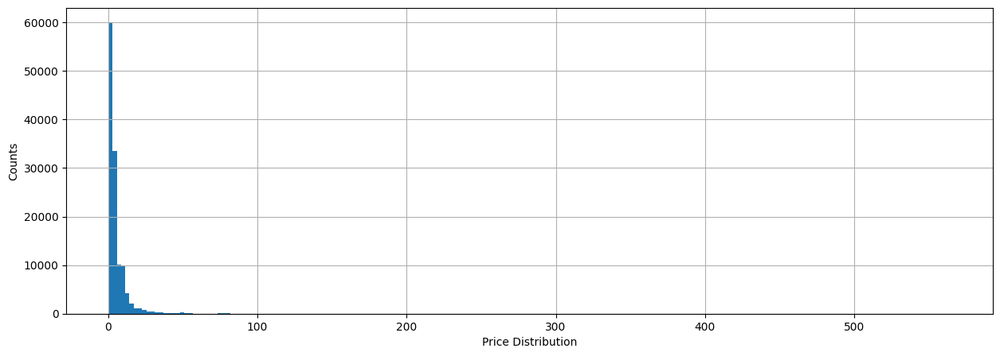

In [21]:
df[df['price_vat']!= 0]['price_vat'].hist(bins=200, figsize=(15,5))
plt.ylabel('Counts')
plt.xlabel('Price Distribution')
plt.show()


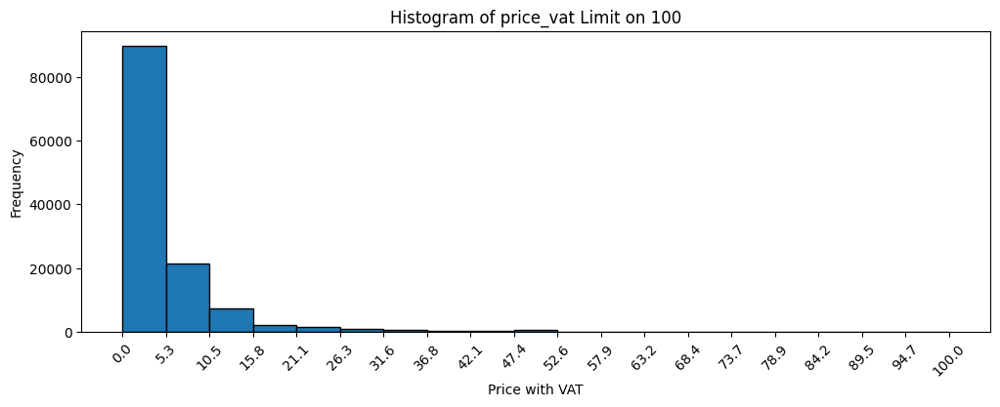

In [22]:
#Lets limit the graph to 100 price
# make 20 bins from 0 to 20 
bins = np.linspace(0, 100, 20).tolist()

plt.figure(figsize=(12, 4))
plt.hist(df[df['price_vat']!= 0]['price_vat'], bins=bins, edgecolor='black')

plt.xticks(bins)
plt.xlabel('Price with VAT')
plt.ylabel('Frequency')
plt.title('Histogram of price_vat Limit on 100')
plt.xticks(rotation=45)
plt.show()


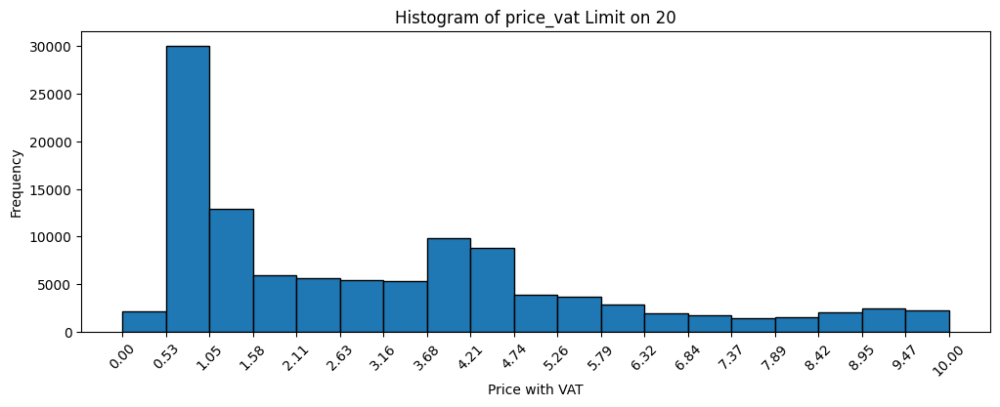

In [23]:

# make 20 bins from 0 to 20 
bins = np.linspace(0, 10, 20).tolist()

plt.figure(figsize=(12, 4))
plt.hist(df[df['price_vat']!= 0]['price_vat'], bins=bins, edgecolor='black')

plt.xticks(bins)
plt.xlabel('Price with VAT')
plt.ylabel('Frequency')
plt.title('Histogram of price_vat Limit on 20')
plt.xticks(rotation=45)
plt.show()


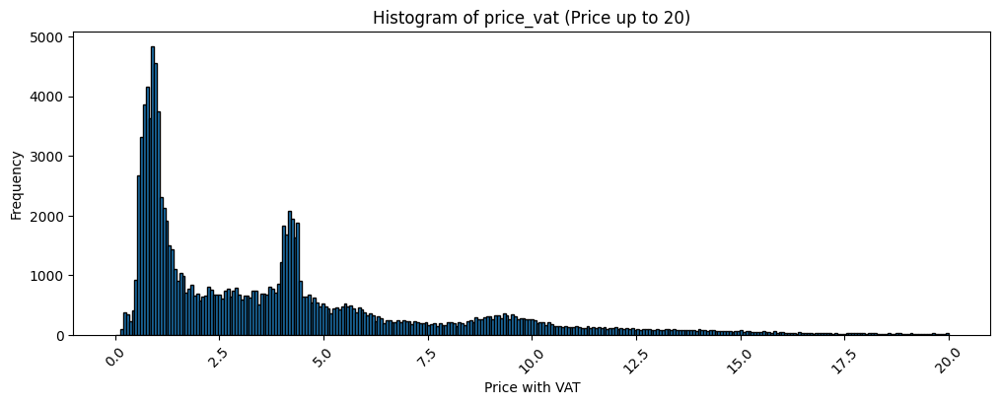

In [24]:
# more detailed
bins = np.linspace(0, 20, 300).tolist()

plt.figure(figsize=(12, 4))
plt.hist(df[df['price_vat']!= 0]['price_vat'], bins=bins, edgecolor='black')
 
plt.xlabel('Price with VAT')
plt.ylabel('Frequency')
plt.title('Histogram of price_vat (Price up to 20)')
plt.xticks(rotation=45)
plt.show()


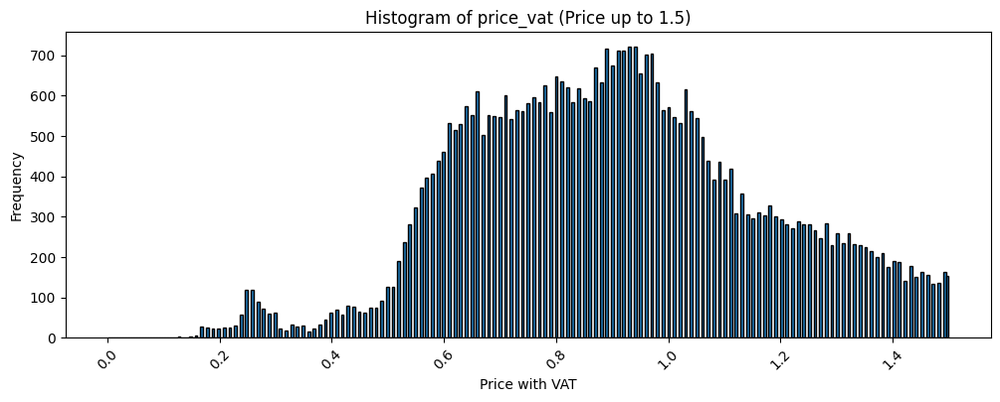

In [25]:
# more detailed
bins = np.linspace(0, 1.5, 300).tolist()

plt.figure(figsize=(12, 4))
plt.hist(df[df['price_vat']!= 0]['price_vat'], bins=bins, edgecolor='black')
 
plt.xlabel('Price with VAT')
plt.ylabel('Frequency')
plt.title('Histogram of price_vat (Price up to 1.5)')
plt.xticks(rotation=45)
plt.show()


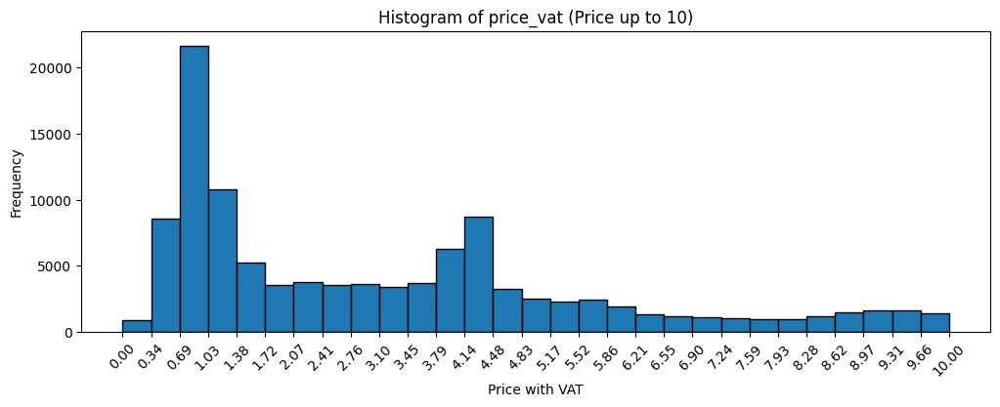

In [26]:
#Lets limit the graph to 100 price
# make 20 bins from 0 to 10 
bins = np.linspace(0, 10, 30).tolist()

plt.figure(figsize=(12, 4))
plt.hist(df[df['price_vat']!= 0]['price_vat'], bins=bins, edgecolor='black')

plt.xticks(bins)
plt.xlabel('Price with VAT')
plt.ylabel('Frequency')
plt.title('Histogram of price_vat (Price up to 10)')
plt.xticks(rotation=45)
plt.show()


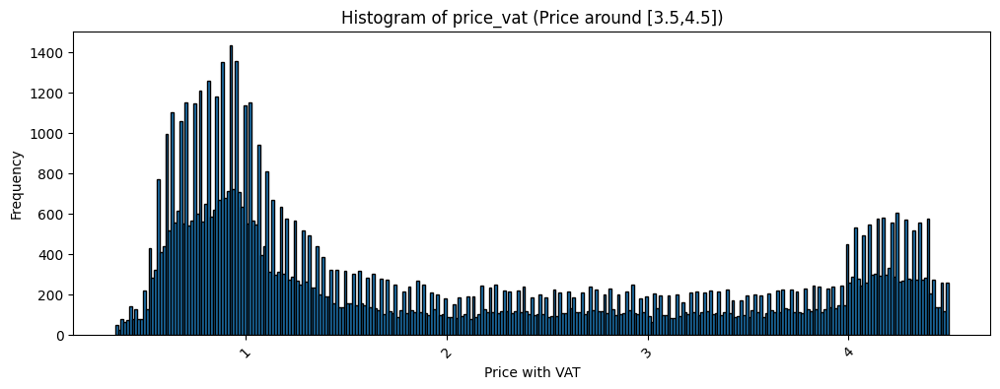

In [27]:
# more detailed
bins = np.linspace(0.35,4.5, 300).tolist()

plt.figure(figsize=(12, 4))
plt.hist(df[df['price_vat']!= 0]['price_vat'], bins=bins, edgecolor='black')
 
plt.xlabel('Price with VAT')
plt.ylabel('Frequency')
plt.title('Histogram of price_vat (Price around [3.5,4.5])')
plt.xticks(rotation=45)
plt.show()


> The bulk of transactions (not revenue nor loss) is around 0.69-1 , 3.79-4.48 on price. 

#####   Outliers (answer question 4)

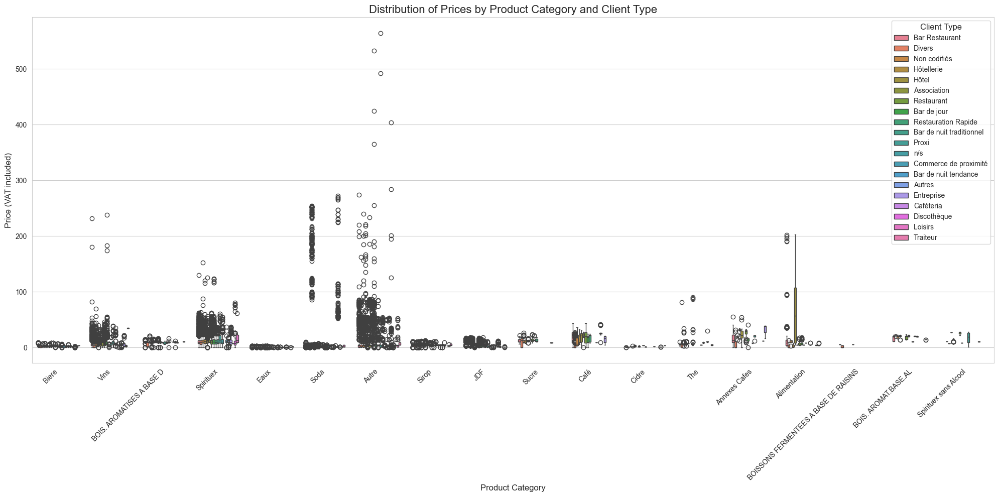

In [28]:

sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(20, 10))
sns.boxplot(x='product_category', y='price_vat', hue='client_type', data=df, ax=ax)
plt.xticks(rotation=45, ha='right')
plt.xlabel('Product Category', fontsize=12)
plt.ylabel('Price (VAT included)', fontsize=12)
plt.title('Distribution of Prices by Product Category and Client Type', fontsize=16)
plt.legend(title='Client Type', title_fontsize='12', fontsize='10', loc='upper right')
plt.tight_layout()
plt.show()

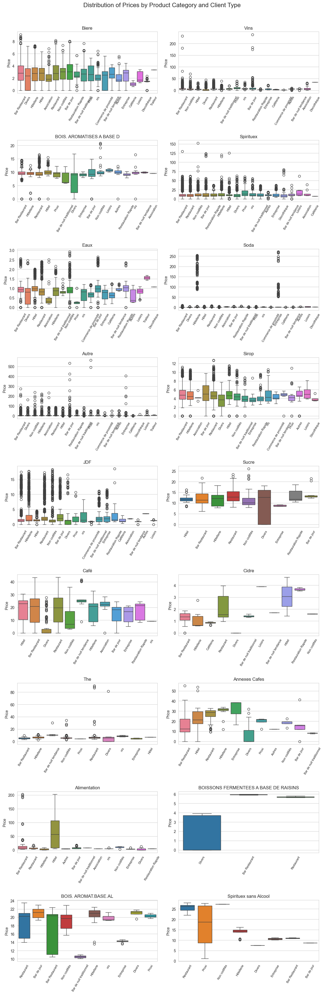

In [29]:
categories = df['product_category'].unique()
n_categories = len(categories)

n_rows = math.ceil(n_categories / 2)
fig, axes = plt.subplots(n_rows, 2, figsize=(12, 4*n_rows))
fig.suptitle('Distribution of Prices by Product Category and Client Type', fontsize=16, y=1.01)

axes = axes.flatten()
 
for i, category in enumerate(categories):
    category_data = df[df['product_category'] == category]
    sns.boxplot(x='client_type', y='price_vat', data=category_data,hue='client_type', ax=axes[i])
   
    axes[i].set_title(category) 
    axes[i].set_ylabel('Price')
    axes[i].set_xlabel(' ') 
    axes[i].tick_params(axis='x', rotation=60,labelsize=8)
 
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])
 
plt.tight_layout()  
plt.show()

> There are a lot of outliers. Lets dive in.

In [30]:
grouped = df.groupby('product_category')

outliers_dict = {}

for category, group in grouped:
    Q1 = group['price_vat'].quantile(0.25)
    Q3 = group['price_vat'].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    category_outliers = group[(group['price_vat'] < lower_bound) | (group['price_vat'] > upper_bound)]
    outliers_dict[category] = category_outliers

all_outliers = pd.concat(outliers_dict.values())

print(f"\nTotal price outliers: {len(all_outliers)}")

for category, outliers in outliers_dict.items():
    print(f"Number of price outliers in {category}: {len(outliers)}")


Total price outliers: 10213
Number of price outliers in Alimentation: 66
Number of price outliers in Annexes Cafes: 0
Number of price outliers in Autre: 1182
Number of price outliers in BOIS. AROMAT.BASE.AL: 0
Number of price outliers in BOIS. AROMATISES A BASE D: 208
Number of price outliers in BOISSONS FERMENTEES A BASE DE RAISINS: 0
Number of price outliers in Biere: 60
Number of price outliers in Café: 0
Number of price outliers in Cidre: 25
Number of price outliers in Eaux: 723
Number of price outliers in JDF: 1387
Number of price outliers in Sirop: 633
Number of price outliers in Soda: 3181
Number of price outliers in Spirituex: 1569
Number of price outliers in Spirituex sans Alcool: 10
Number of price outliers in Sucre: 19
Number of price outliers in The: 58
Number of price outliers in Vins: 1092


In [31]:
#Examples of products that are outliers per category
for category in all_outliers.product_category.unique().tolist():
  print(category, '.'*(27-len(category)),all_outliers[all_outliers['product_category'] == category].product_name.unique().tolist()[:10])

Alimentation ............... ['HUILE DE FRITURE BENOIT', 'CHOCOLAT BEVENDA SEGAFREDO', 'CHOCOLAT HOT CIOK MANUEL SEGAFREDO', 'HUILE DE FRITURE']
Autre ...................... ['TUBE CO2 ORANGE S - L2PI', 'FORFAIT GAZ CO2', 'TUBE CO2 ORANGE ** S **- L2PI', 'REMISE TVA 2', 'PASTILLES NETTOYAGE MAC LF', 'CHT GLORIA ROUGE', 'B100N LIQUIDE DE RINCAGE UNIV. BLEU', 'DETERGENT LIQUIDE F420E', 'TUBE AZOTE 1.3M ORANGE S - L2PI', 'KIT NETTOYAGE PULY CAFE VD3049']
BOIS. AROMATISES A BASE D .. ['CINZANO BIANCO CRD', 'SANGRIA FIESTA', 'SANGRIA LOLEA BLC PETILLANT N°2', 'RAMAZOTTI APERITIVO ROSATO', 'SOHO LITCHI CRD', 'MARTINI BIANCO CRD', 'SUZE C.R.D', 'MARTINI ROSE CRD 4', 'SANGRIA LOLEA RGE PETILLANT N°1', 'MARTINI ROSSO CRD']
Biere ...................... ['1664 DRAUGHT MASTER (CHR)', 'HOEGAARDEN ROSEE', 'BROOKLYN EAST IPA', 'GOOSE MIDWAY IPA', '" CIGARE" ABBAYE LEFFE BLDE IFK', 'GRIMBERGEN BLONDE', 'BIERE DE NOEL ABBAYE LEFFE', 'LEFFE ROYALE ** ATTENTION **', 'CORONA 5', 'ABBAYE DE LEFFE RUBY']
Ci

#### - Quantity

In [32]:
df['quantity'].describe()

count    131794.000000
mean         25.338483
std          82.394993
min       -4775.000000
25%           2.000000
50%          12.000000
75%          26.000000
max        5654.000000
Name: quantity, dtype: float64

> There seem to be negative quantities.. which is counter intuitive. Lets find out why

In [33]:
df[df.quantity < 0]

,transaction_date,client_id,transaction_id,product_id,product_name,price_vat,quantity,client_type,product_category
65,2024-06-28,b099bf3f9c,8cf8a1c1b0,1253e9373e,FORFAIT GAZ CO2,15.43,-1.0,Association,Autre
66,2024-06-28,b099bf3f9c,8cf8a1c1b0,0cce0bd361,GOTHIC BLONDE M,1.69,-310.0,Association,Biere
240,2024-06-28,67b30d95ff,d982394e62,5ec1a0c99d,PAGO NECTAR ANANAS,1.52,-13.0,Hôtel,JDF
372,2024-06-27,fbeb3d5f8b,46da699057,6c0f341284,LES HAUTS DE STE MARIE BLC,4.78,-4.0,Hôtellerie,Vins
457,2024-06-26,f5b4fcce63,33c2be0241,09895de040,PERLINEA SEGA,18.42,-1.0,Hôtel,Annexes Cafes
...,...,...,...,...,...,...,...,...,...
131612,2022-01-10,b18f9eabe5,b405178202,ef2d127de3,SPRITE,0.86,-12.0,Commerce de proximité,Soda
131886,2022-01-04,8f85d410a6,e31820d89c,f1de64eac8,BIERE DE NOEL LICORNE,2.77,-137.0,Bar Restaurant,Biere
131887,2022-01-04,8f85d410a6,e31820d89c,73d3f1ba06,KARLSBRAU BIERE ALLEMANDE,0.00,-31.0,Bar Restaurant,Biere
131889,2022-01-04,8f85d410a6,e31820d89c,0fd42b3f73,TUBE CO2 ORANGE S - L2PI,71.05,-1.0,Bar Restaurant,Autre


In [34]:
df[df.quantity < 0].product_category.unique()

array(['Autre', 'Biere', 'JDF', 'Vins', 'Annexes Cafes', 'Soda', 'Sucre',
       'Spirituex', 'Eaux', 'BOIS. AROMATISES A BASE D', 'Alimentation',
       'Sirop', 'Café', 'BOISSONS FERMENTEES A BASE DE RAISINS',
       'Spirituex sans Alcool', 'Cidre', 'The'], dtype=object)

In [35]:
df[df.quantity < 0].client_type.unique()

array(['Association', 'Hôtel', 'Hôtellerie', 'Autres', 'Restaurant',
       'Bar Restaurant', 'Bar de jour', 'Divers', 'n/s', 'Non codifiés',
       'Commerce de proximité', 'Bar de nuit tendance', 'Entreprise',
       'Proxi', 'Caféteria', 'Restauration Rapide',
       'Bar de nuit traditionnel', 'Loisirs', 'Discothèque'], dtype=object)

In [36]:
df[df.quantity < 0].product_name.unique().tolist()[:10]

['FORFAIT GAZ CO2',
 'GOTHIC BLONDE M',
 'PAGO NECTAR ANANAS',
 'LES HAUTS DE STE MARIE BLC',
 'PERLINEA SEGA',
 'PILS METEOR',
 'PIETRA CORSICAN IPA',
 'JUPILER',
 'OASIS TROPICAL',
 'PEPSI COLA']

> There do not seem to be an error to a particular category nor client.

> We will assume that negative values are returns and adjustable accounting

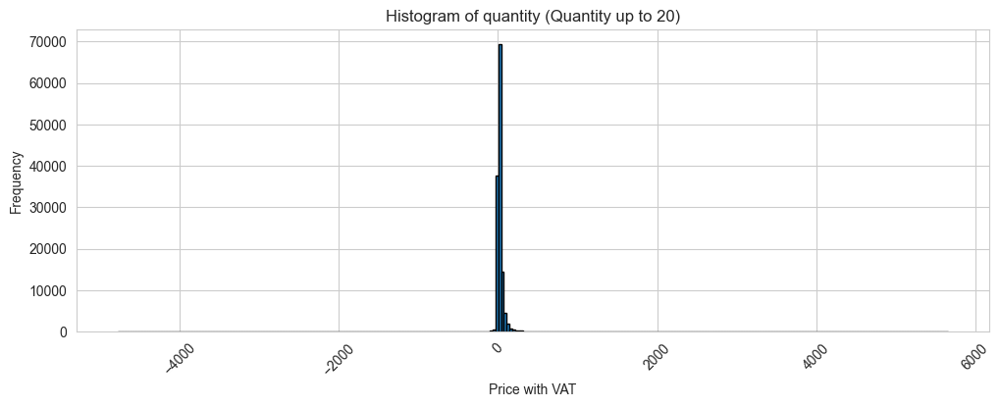

In [37]:
# general
bins = np.linspace(df.quantity.min(), df.quantity.max(), 300).tolist()

plt.figure(figsize=(12, 4))
plt.hist(df[df['quantity']!= 0]['quantity'], bins=bins, edgecolor='black')
 
plt.xlabel('Price with VAT')
plt.ylabel('Frequency')
plt.title('Histogram of quantity (Quantity up to 20)')
plt.xticks(rotation=45)
plt.show()


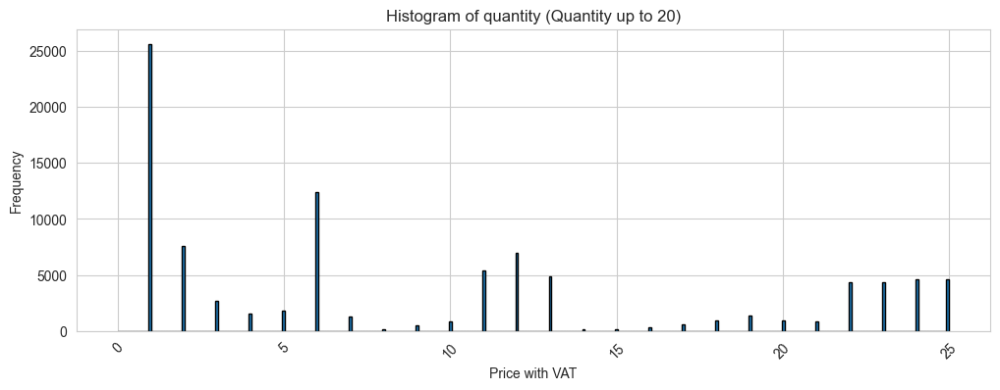

In [38]:
# more detailed
bins = np.linspace(0, 25, 300).tolist()

plt.figure(figsize=(12, 4))
plt.hist(df[df['quantity']!= 0]['quantity'], bins=bins, edgecolor='black')
 
plt.xlabel('Price with VAT')
plt.ylabel('Frequency')
plt.title('Histogram of quantity (Quantity up to 20)')
plt.xticks(rotation=45)
plt.show()

> We will explore later which products, clients and categories are the most returned/used.

#### - Client ID

In [39]:
df.groupby('product_category').client_id.nunique()

product_category
Alimentation                              55
Annexes Cafes                             41
Autre                                    253
BOIS. AROMAT.BASE.AL                      33
BOIS. AROMATISES A BASE D                111
BOISSONS FERMENTEES A BASE DE RAISINS      8
Biere                                    248
Café                                      75
Cidre                                     27
Eaux                                     190
JDF                                      142
Sirop                                    142
Soda                                     163
Spirituex                                165
Spirituex sans Alcool                     10
Sucre                                     59
The                                       31
Vins                                     176
Name: client_id, dtype: int64

In [40]:
df.groupby('client_type').client_id.nunique()

client_type
Association                 20
Autres                      10
Bar Restaurant              34
Bar de jour                 13
Bar de nuit tendance         1
Bar de nuit traditionnel     5
Caféteria                    1
Commerce de proximité        3
Discothèque                  1
Divers                      51
Entreprise                   9
Hôtel                       13
Hôtellerie                  14
Loisirs                      4
Non codifiés                35
Proxi                        4
Restaurant                  43
Restauration Rapide          4
Traiteur                     1
n/s                          9
Name: client_id, dtype: int64

In [41]:
# Doe clients buy different products? 
(df.groupby('client_id')['product_category'].nunique()> 1).any()

np.True_

In [42]:
# Do clients have more than 1 client_type?
(df.groupby(['client_id']).client_type.nunique()>1).any()

np.False_

> Thus there are no clients who have transactions in more than one type of client_types.

### c) Categorical Variables

#### - Product Category

In [43]:
df.product_category.unique()

array(['Biere', 'Vins', 'BOIS. AROMATISES A BASE D', 'Spirituex', 'Eaux',
       'Soda', 'Autre', 'Sirop', 'JDF', 'Sucre', 'Café', 'Cidre', 'The',
       'Annexes Cafes', 'Alimentation',
       'BOISSONS FERMENTEES A BASE DE RAISINS', 'BOIS. AROMAT.BASE.AL',
       'Spirituex sans Alcool'], dtype=object)

#### - Product Name

In [44]:
df.product_name.describe()

count     131794
unique      1814
top          F.A
freq        7199
Name: product_name, dtype: object

In [45]:
df.product_name.unique().tolist()[:10]

['"CIGARE" HOEGAARDEN BLANCHE IFK',
 '" CIGARE" ABBAYE LEFFE BLDE IFK',
 'DOM. COUSSIN ROSE 23 CROIX PRIEUR',
 'PUR GRIS ROSE VDP MEDITERRANNEE',
 'MARTINI ROSSO CRD',
 'CAMPARI',
 'PASTIS 51',
 'RHUM BLANC DAMOISEAU',
 'MARTINI BIANCO CRD',
 'PERRIER']

In [46]:
# does any product_id has more than one product name? 
(df.groupby('product_id')['product_name'].nunique()> 1).any()

np.False_

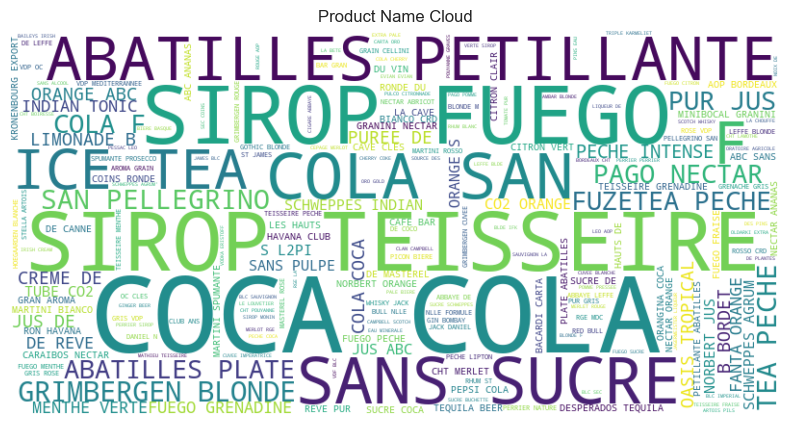

In [47]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(df.product_name))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Product Name Cloud')
plt.show()


> There is certainly a lot of cleanning and feature complementary work we can do here, such as bringing item related features (i.e.: has sugar, volume, presented as produced...)

#### - Client Type

In [48]:
df.client_type.describe()

count         131794
unique            20
top       Restaurant
freq           32229
Name: client_type, dtype: object

In [49]:
df.client_type.unique()

array(['Bar Restaurant', 'Divers', 'Non codifiés', 'Hôtellerie', 'Hôtel',
       'Association', 'Restaurant', 'Bar de jour', 'Restauration Rapide',
       'Bar de nuit traditionnel', 'Proxi', 'n/s',
       'Commerce de proximité', 'Bar de nuit tendance', 'Autres',
       'Entreprise', 'Caféteria', 'Discothèque', 'Loisirs', 'Traiteur'],
      dtype=object)

In [50]:
df[df.client_type == 'n/s'].head(3)

,transaction_date,client_id,transaction_id,product_id,product_name,price_vat,quantity,client_type,product_category
427,2024-06-27,197f60e75a,375ccff576,e29c9c180c,LIMONETTE,0.72,11.0,n/s,Soda
428,2024-06-27,197f60e75a,375ccff576,dbae772db2,LONDON ESSENCE SPICED GINGER BEER,1.32,25.0,n/s,Soda
429,2024-06-27,197f60e75a,375ccff576,d829857eb1,GIN BOMBAY ORIGINAL,7.58,2.0,n/s,Spirituex


In [51]:
df[df.client_type == 'Autres'].head(3)

,transaction_date,client_id,transaction_id,product_id,product_name,price_vat,quantity,client_type,product_category
1004,2024-06-26,49dcdeea57,45a9c635ac,ffa6059b95,PILS METEOR,2.59,-32.0,Autres,Biere
1005,2024-06-26,49dcdeea57,131e705ee2,cbd02d97b0,1664 SANS ALCOOL,1.12,13.0,Autres,Biere
1006,2024-06-26,49dcdeea57,131e705ee2,7b2c21ead1,CREME DE PECHE GRAVURE FUEGO,5.84,1.0,Autres,Spirituex


> N/S and 'Autres' maybe could be imputed by the client_id?

In [52]:
unknown_users_list = df[(df.client_type == 'n/s')| (df.client_type == 'Autres')].client_id.unique().tolist()

In [53]:
for client in unknown_users_list:
  print(client, df[(df.client_id == client) & ((df.client_type != 'n/s') & (df.client_type != 'Autres'))].client_type.unique().tolist())

197f60e75a []
49dcdeea57 []
be0faac62b []
7d637b8fbb []
746e838fab []
e48a488f9e []
7eb2ed5ef7 []
738fc646e0 []
b29fdbea2b []
62f613bcc6 []
be1bf6fcb7 []


4fd4b44804 []
7e8c7726d3 []
ec1ab6721b []
c41cdf6035 []
ddc11d3f49 []
0cdd9be176 []
ad7f80abfa []
f33f9cd502 []


> seems like the clients and client_types is a 1 to 1 relationship.

In [54]:
#Confirm there are more than one client type per client_id
(df.groupby('client_id')['client_type'].nunique()> 1).any()

np.False_

In [55]:
df.sample(3000).to_csv('cleaned.csv',index=False)

## 3) Feature Creation

In [56]:
df.head(3)

,transaction_date,client_id,transaction_id,product_id,product_name,price_vat,quantity,client_type,product_category
0,2024-06-28,f218bbcf08,576a451c59,fc56dbc6d4,"""CIGARE"" HOEGAARDEN BLANCHE IFK",3.44,19.0,Bar Restaurant,Biere
1,2024-06-28,f218bbcf08,576a451c59,fa2b7af0a8,""" CIGARE"" ABBAYE LEFFE BLDE IFK",4.22,22.0,Bar Restaurant,Biere
2,2024-06-28,f218bbcf08,576a451c59,a9b9bd8e0e,DOM. COUSSIN ROSE 23 CROIX PRIEUR,7.00,5.0,Bar Restaurant,Vins


### a) Total, Revenue and Loss

In [57]:
df['total'] = df.quantity * df.price_vat
df['revenue'] = df.total.apply(lambda x :x if x >= 0 else 0)
df['loss'] = df.total.apply(lambda x :x if x < 0 else 0)
df

,transaction_date,client_id,transaction_id,product_id,product_name,price_vat,quantity,client_type,product_category,total,revenue,loss
0,2024-06-28,f218bbcf08,576a451c59,fc56dbc6d4,"""CIGARE"" HOEGAARDEN BLANCHE IFK",3.44,19.0,Bar Restaurant,Biere,65.36,65.36,0.0
1,2024-06-28,f218bbcf08,576a451c59,fa2b7af0a8,""" CIGARE"" ABBAYE LEFFE BLDE IFK",4.22,22.0,Bar Restaurant,Biere,92.84,92.84,0.0
2,2024-06-28,f218bbcf08,576a451c59,a9b9bd8e0e,DOM. COUSSIN ROSE 23 CROIX PRIEUR,7.00,5.0,Bar Restaurant,Vins,35.00,35.00,0.0
3,2024-06-28,f218bbcf08,576a451c59,8bcbb4c131,PUR GRIS ROSE VDP MEDITERRANNEE,4.32,12.0,Bar Restaurant,Vins,51.84,51.84,0.0
4,2024-06-28,cb6df13f84,6d77640593,e3f6959781,MARTINI ROSSO CRD,10.33,2.0,Bar Restaurant,BOIS. AROMATISES A BASE D,20.66,20.66,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
131989,2022-01-03,339bc58604,72f43cfd90,e29c9c180c,LIMONETTE,0.84,39.0,Bar Restaurant,Soda,32.76,32.76,0.0
131990,2022-01-03,339bc58604,72f43cfd90,c75d3f1f5b,VILLA MASSA LIMONCELLO,9.78,3.0,Bar Restaurant,Spirituex,29.34,29.34,0.0
131991,2022-01-03,339bc58604,72f43cfd90,a0eaec5a55,EDV POIRE WILLIAMS ST FLORIAN,5.97,3.0,Bar Restaurant,Spirituex,17.91,17.91,0.0
131992,2022-01-03,339bc58604,72f43cfd90,72440a20f5,LIQUEUR MANZANITA MB,8.52,3.0,Bar Restaurant,Spirituex,25.56,25.56,0.0


### b) Daily, Weekly and Monthly state

In [58]:
print(df.head(2))

  transaction_date   client_id transaction_id  product_id  \
0       2024-06-28  f218bbcf08     576a451c59  fc56dbc6d4   
1       2024-06-28  f218bbcf08     576a451c59  fa2b7af0a8   

                      product_name  price_vat  quantity     client_type  \
0  "CIGARE" HOEGAARDEN BLANCHE IFK       3.44      19.0  Bar Restaurant   
1  " CIGARE" ABBAYE LEFFE BLDE IFK       4.22      22.0  Bar Restaurant   

  product_category  total  revenue  loss  
0            Biere  65.36    65.36   0.0  
1            Biere  92.84    92.84   0.0  


In [59]:
day_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}

df['day'] = df['transaction_date'].dt.dayofweek
df['day'] = df['day'].map(day_names)
df['week'] = df['transaction_date'].dt.isocalendar().week
df['month'] = df['transaction_date'].dt.to_period('M')
df['year'] = df['transaction_date'].dt.to_period('Y')



## 4) EDA Multivariable

### 4.1) Total/Revenue/Loss per... product/client_type

##### Yearly

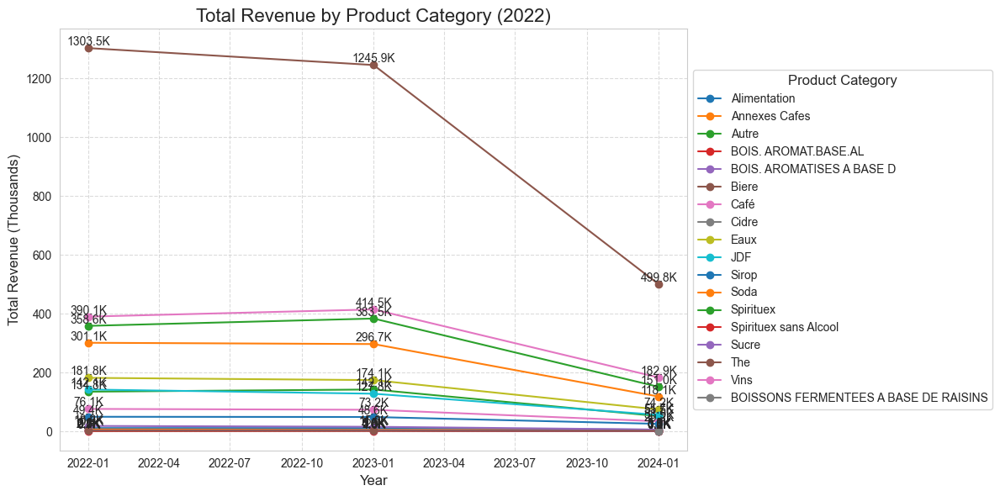

In [60]:
 
grouped = df.groupby(['year', 'product_category'])[['total']].sum().reset_index()

# Convert 'year' to datetime if it's not already
grouped['year'] = pd.to_datetime(grouped['year'].astype(str))

plt.figure(figsize=(12, 6))
for category in grouped['product_category'].unique():
    category_data = grouped[grouped['product_category'] == category]
    plt.plot(category_data['year'], category_data['total'] / 1000, marker='o', label=category)

# Customize the plot
plt.title('Total Revenue by Product Category (2022)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Revenue (Thousands)', fontsize=12)
plt.legend(title='Product Category', title_fontsize=12, fontsize=10, loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True, linestyle='--', alpha=0.7)

# Add value labels in K (thousands)
for category in grouped['product_category'].unique():
    category_data = grouped[grouped['product_category'] == category]
    for x, y in zip(category_data['year'], category_data['total'] / 1000):
        plt.text(x, y, f'{y:.1f}K', ha='center', va='bottom')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

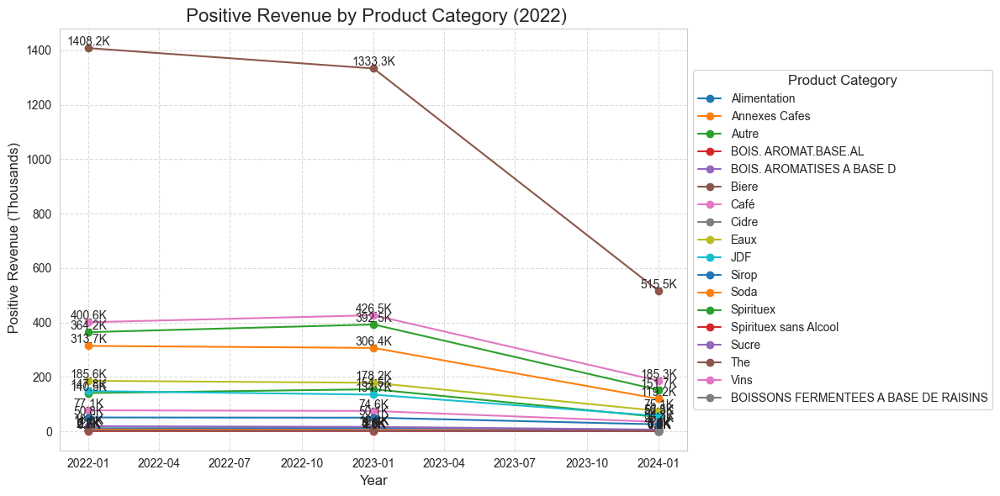

In [61]:
 
grouped = df.groupby(['year', 'product_category'])[['revenue']].sum().reset_index()

# Convert 'year' to datetime if it's not already
grouped['year'] = pd.to_datetime(grouped['year'].astype(str))

plt.figure(figsize=(12, 6))
for category in grouped['product_category'].unique():
    category_data = grouped[grouped['product_category'] == category]
    plt.plot(category_data['year'], category_data['revenue'] / 1000, marker='o', label=category)

# Customize the plot
plt.title(' Positive Revenue by Product Category (2022)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel(' Positive Revenue (Thousands)', fontsize=12)
plt.legend(title='Product Category', title_fontsize=12, fontsize=10, loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True, linestyle='--', alpha=0.7)

# Add value labels in K (thousands)
for category in grouped['product_category'].unique():
    category_data = grouped[grouped['product_category'] == category]
    for x, y in zip(category_data['year'], category_data['revenue'] / 1000):
        plt.text(x, y, f'{y:.1f}K', ha='center', va='bottom')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

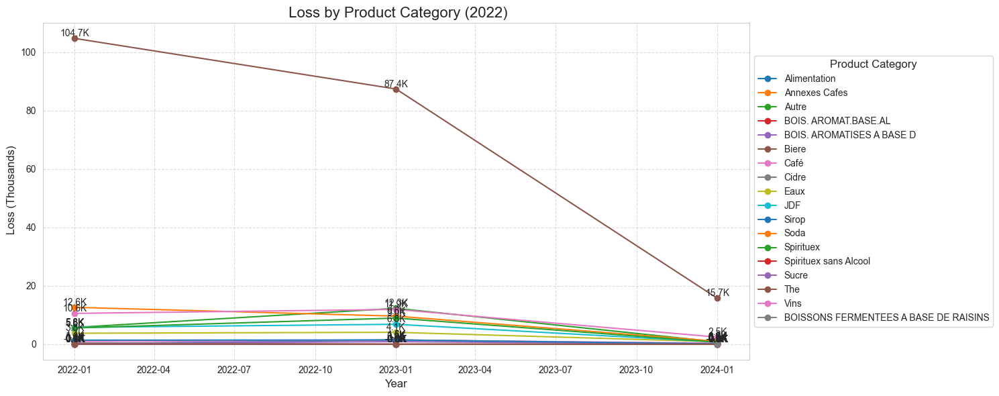

In [62]:
 
grouped = df.groupby(['year', 'product_category'])[['loss']].sum().reset_index()

# Convert 'year' to datetime if it's not already
grouped['year'] = pd.to_datetime(grouped['year'].astype(str))

plt.figure(figsize=(15, 6))
for category in grouped['product_category'].unique():
    category_data = grouped[grouped['product_category'] == category]
    plt.plot(category_data['year'], -category_data['loss'] / 1000, marker='o', label=category)

# Customize the plot
plt.title(' Loss by Product Category (2022)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel(' Loss (Thousands)', fontsize=12)
plt.legend(title='Product Category', title_fontsize=12, fontsize=10, loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True, linestyle='--', alpha=0.7)

# Add value labels in K (thousands)
for category in grouped['product_category'].unique():
    category_data = grouped[grouped['product_category'] == category]
    for x, y in zip(category_data['year'], -category_data['loss'] / 1000):
        plt.text(x, y, f'{y:.1f}K', ha='center', va='bottom')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

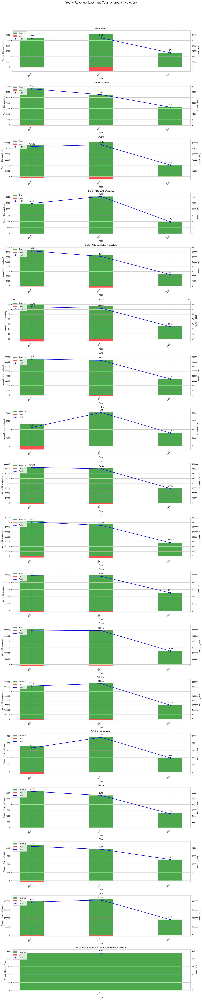

In [63]:
grouped = df.groupby(['year', 'product_category'])[['revenue', 'loss', 'total']].sum().reset_index()


categories =  grouped['product_category'].unique()

fig, axes = plt.subplots(len(categories), 1, figsize=(15, 4*len(categories)))
fig.suptitle('Yearly Revenue, Loss, and Total by product_category', fontsize=16, y=1.02)

for i, category in enumerate(categories):
    category_data = grouped[grouped['product_category'] == category]
    
    ax = axes[i] if len(categories) > 1 else axes
    ax2 = ax.twinx()      
    x = range(len(category_data))
    ax.bar(x, category_data['revenue'], width=0.35, label='Revenue', color='g', alpha=0.7)
    ax.bar(x, category_data['loss'], width=0.35, label='Loss', color='r', alpha=0.7)
    
    line = ax2.plot(x, category_data['total'], color='b', marker='o', linestyle='-', linewidth=2, markersize=6, label='Total')
    
    for j, total in enumerate(category_data['total']):
        ax2.annotate(f'{total/1000:.1f}k', (x[j], total), textcoords="offset points", xytext=(0,10), ha='center')
    
        ax.set_title(f'{category}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Amount (Revenue/Loss)')
        ax2.set_ylabel('Amount (Total)')
        ax.set_xticks(x)
        ax.set_xticklabels(category_data['year'].astype(str), rotation=45, ha='right')
    
        ymin = min(category_data['loss'].min(), 0)
        ymax = max(category_data['revenue'].max(), category_data['total'].max())
        ax.set_ylim(ymin * 1.1, ymax * 1.1)      
        ax2.set_ylim(ax.get_ylim())      
        ax.axhline(y=0, color='k', linestyle='-', linewidth=0.5)
    
        lines1, labels1 = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.tight_layout()
plt.show()

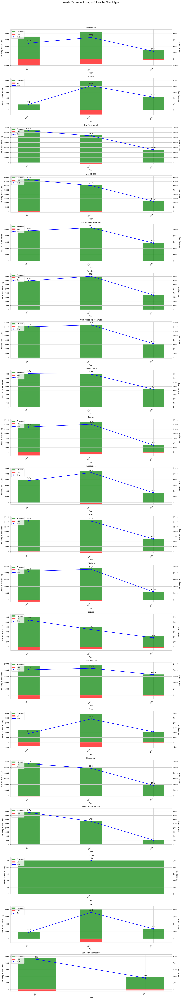

In [64]:
grouped = df.groupby(['year', 'client_type'])[['revenue', 'loss', 'total']].sum().reset_index()


categories =  grouped['client_type'].unique()

fig, axes = plt.subplots(len(categories), 1, figsize=(15, 4*len(categories)))
fig.suptitle('Yearly Revenue, Loss, and Total by Client Type', fontsize=16, y=1.02)

for i, category in enumerate(categories):
    category_data = grouped[grouped['client_type'] == category]
    
    ax = axes[i] if len(categories) > 1 else axes
    ax2 = ax.twinx()      
    x = range(len(category_data))
    ax.bar(x, category_data['revenue'], width=0.35, label='Revenue', color='g', alpha=0.7)
    ax.bar(x, category_data['loss'], width=0.35, label='Loss', color='r', alpha=0.7)
    
    line = ax2.plot(x, category_data['total'], color='b', marker='o', linestyle='-', linewidth=2, markersize=6, label='Total')
    
    for j, total in enumerate(category_data['total']):
        ax2.annotate(f'{total/1000:.1f}k', (x[j], total), textcoords="offset points", xytext=(0,10), ha='center')
    
        ax.set_title(f'{category}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Amount (Revenue/Loss)')
        ax2.set_ylabel('Amount (Total)')
        ax.set_xticks(x)
        ax.set_xticklabels(category_data['year'].astype(str), rotation=45, ha='right')
    
        ymin = min(category_data['loss'].min(), 0)
        ymax = max(category_data['revenue'].max(), category_data['total'].max())
        ax.set_ylim(ymin * 1.1, ymax * 1.1)      
        ax2.set_ylim(ax.get_ylim())      
        ax.axhline(y=0, color='k', linestyle='-', linewidth=0.5)
    
        lines1, labels1 = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.tight_layout()
plt.show()

#### Monthly

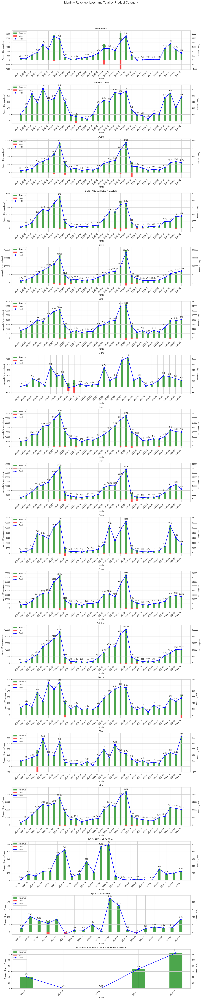

In [65]:
grouped = df.groupby(['month', 'product_category'])[['revenue', 'loss', 'total']].sum().reset_index()


categories =  grouped['product_category'].unique()


fig, axes = plt.subplots(len(categories), 1, figsize=(15, 4*len(categories)))
fig.suptitle('Monthly Revenue, Loss, and Total by Product Category', fontsize=16, y=1.02)


for i, category in enumerate(categories):
    category_data = grouped[grouped['product_category'] == category]
    
    ax = axes[i] if len(categories) > 1 else axes
    ax2 = ax.twinx()  
    
    x = range(len(category_data))
    ax.bar(x, category_data['revenue'], width=0.35, label='Revenue', color='g', alpha=0.7)
    ax.bar(x, category_data['loss'], width=0.35, label='Loss', color='r', alpha=0.7)    
    line = ax2.plot(x, category_data['total'], color='b', marker='o', linestyle='-', linewidth=2, markersize=6, label='Total')
    
    
    for j, total in enumerate(category_data['total']):
        ax2.annotate(f'{total/1000:.1f}k', (x[j], total), textcoords="offset points", xytext=(0,10), ha='center')
        ax.set_title(f'{category}')
        ax.set_xlabel('Month')
        ax.set_ylabel('Amount (Revenue/Loss)')
        ax2.set_ylabel('Amount (Total)')
        ax.set_xticks(x)
        ax.set_xticklabels(category_data['month'].astype(str), rotation=45, ha='right')    
        ymin = min(category_data['loss'].min(), 0)  
        ymax = max(category_data['revenue'].max(), category_data['total'].max())
        ax.set_ylim(ymin * 1.1, ymax * 1.1)  
        ax2.set_ylim(ax.get_ylim())     
        ax.axhline(y=0, color='k', linestyle='-', linewidth=0.5)   
        lines1, labels1 = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.tight_layout()
plt.show()

#### -Answer- How is revenue distrubited across different customer segments?  (Answer Question 3) 

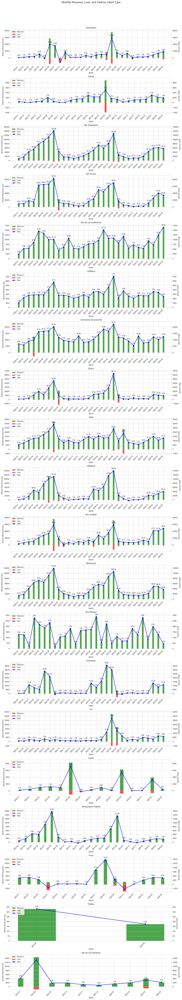

In [66]:
grouped = df.groupby(['month', 'client_type'])[['revenue', 'loss', 'total']].sum().reset_index()


# Get unique product categories
categories =  grouped['client_type'].unique()

# Create subplots
fig, axes = plt.subplots(len(categories), 1, figsize=(15, 4*len(categories)))
fig.suptitle('Monthly Revenue, Loss, and Total by Client Type', fontsize=16, y=1.02)

# Plot for each category
for i, category in enumerate(categories):
    category_data = grouped[grouped['client_type'] == category]
    
    ax = axes[i] if len(categories) > 1 else axes
    ax2 = ax.twinx()  # Create a secondary y-axis
    
    # Plot revenue and loss bars
    x = range(len(category_data))
    ax.bar(x, category_data['revenue'], width=0.35, label='Revenue', color='g', alpha=0.7)
    ax.bar(x, category_data['loss'], width=0.35, label='Loss', color='r', alpha=0.7)
    
    # Plot total line on secondary axis
    line = ax2.plot(x, category_data['total'], color='b', marker='o', linestyle='-', linewidth=2, markersize=6, label='Total')
    
    # Add total numbers as text
    for j, total in enumerate(category_data['total']):
        ax2.annotate(f'{total/1000:.1f}k', (x[j], total), textcoords="offset points", xytext=(0,10), ha='center')
    
    # Set labels and title
    ax.set_title(f'{category}')
    ax.set_xlabel('Month')
    ax.set_ylabel('Amount (Revenue/Loss)')
    ax2.set_ylabel('Amount (Total)')
    
    # Set x-axis ticks and labels
    ax.set_xticks(x)
    ax.set_xticklabels(category_data['month'].astype(str), rotation=45, ha='right')
    
    # Set y-axis limits to accommodate all data
    ymin = min(category_data['loss'].min(), 0)  # Ensure 0 is included
    ymax = max(category_data['revenue'].max(), category_data['total'].max())
    ax.set_ylim(ymin * 1.1, ymax * 1.1)  # Add 10% padding at both ends
    ax2.set_ylim(ax.get_ylim())  # Set secondary axis limits to match primary axis
    
    # Add a horizontal line at y=0
    ax.axhline(y=0, color='k', linestyle='-', linewidth=0.5)
    
    # Add legend
    lines1, labels1 = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.tight_layout()
plt.show()

#### Weekly

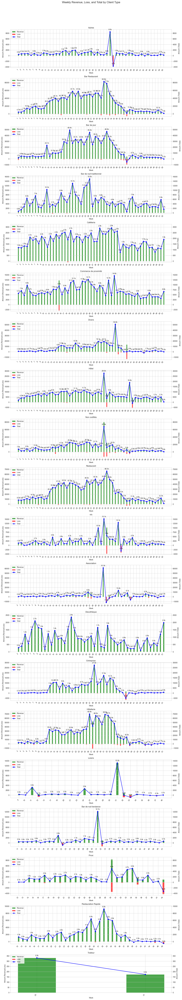

In [67]:
grouped = df.groupby(['week', 'client_type'])[['revenue', 'loss', 'total']].sum().reset_index()

categories =  grouped['client_type'].unique()

fig, axes = plt.subplots(len(categories), 1, figsize=(15, 4*len(categories)))
fig.suptitle('Weekly Revenue, Loss, and Total by Client Type', fontsize=16, y=1.02)

for i, category in enumerate(categories):
    category_data = grouped[grouped['client_type'] == category]
    
    ax = axes[i] if len(categories) > 1 else axes
    ax2 = ax.twinx()
    
    x = range(len(category_data))
    ax.bar(x, category_data['revenue'], width=0.35, label='Revenue', color='g', alpha=0.7)
    ax.bar(x, category_data['loss'], width=0.35, label='Loss', color='r', alpha=0.7)
    
    line = ax2.plot(x, category_data['total'], color='b', marker='o', linestyle='-', linewidth=2, markersize=6, label='Total')
    
    for j, total in enumerate(category_data['total']):
        ax2.annotate(f'{total/1000:.1f}k', (x[j], total), textcoords="offset points", xytext=(0,10), ha='center')
    
    ax.set_title(f'{category}')
    ax.set_xlabel('Week')
    ax.set_ylabel('Amount (Revenue/Loss)')
    ax2.set_ylabel('Amount (Total)')
    
    ax.set_xticks(x)
    ax.set_xticklabels(category_data['week'].astype(str), rotation=45, ha='right')
    
    ymin = min(category_data['loss'].min(), 0)  
    ymax = max(category_data['revenue'].max(), category_data['total'].max())
    ax.set_ylim(ymin * 1.1, ymax * 1.1)  
    ax2.set_ylim(ax.get_ylim())  
    
    ax.axhline(y=0, color='k', linestyle='-', linewidth=0.5)
    
    lines1, labels1 = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.tight_layout()
plt.show()

#### Daily

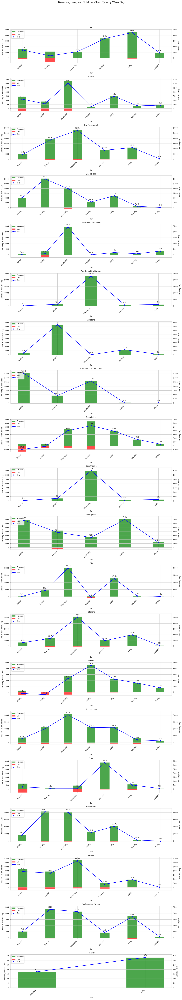

In [68]:
grouped = df.groupby(['day', 'client_type'])[['revenue', 'loss', 'total']].sum().reset_index()

day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
grouped['day'] = pd.Categorical(grouped['day'], categories=day_order, ordered=True)
grouped = grouped.sort_values('day')


categories =  grouped['client_type'].unique()

fig, axes = plt.subplots(len(categories), 1, figsize=(15, 4*len(categories)))
fig.suptitle(' Revenue, Loss, and Total per Client Type by Week Day', fontsize=16, y=1.02)

for i, category in enumerate(categories):
    category_data = grouped[grouped['client_type'] == category]
    
    ax = axes[i] if len(categories) > 1 else axes
    ax2 = ax.twinx()      
    
    x = range(len(category_data))
    ax.bar(x, category_data['revenue'], width=0.35, label='Revenue', color='g', alpha=0.7)
    ax.bar(x, category_data['loss'], width=0.35, label='Loss', color='r', alpha=0.7)
    
    line = ax2.plot(x, category_data['total'], color='b', marker='o', linestyle='-', linewidth=2, markersize=6, label='Total')
    
    for j, total in enumerate(category_data['total']):
        ax2.annotate(f'{total/1000:.1f}k', (x[j], total), textcoords="offset points", xytext=(0,10), ha='center')
    
    ax.set_title(f'{category}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Amount (Revenue/Loss)')
    ax2.set_ylabel('Amount (Total)')
    
    ax.set_xticks(x)
    ax.set_xticklabels(category_data['day'].astype(str), rotation=45, ha='right')
    
    ymin = min(category_data['loss'].min(), 0)  
    ymax = max(category_data['revenue'].max(), category_data['total'].max())
    ax.set_ylim(ymin * 1.1, ymax * 1.1)  
    ax2.set_ylim(ax.get_ylim())  
    
    ax.axhline(y=0, color='k', linestyle='-', linewidth=0.5)
    
    lines1, labels1 = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.tight_layout()
plt.show()

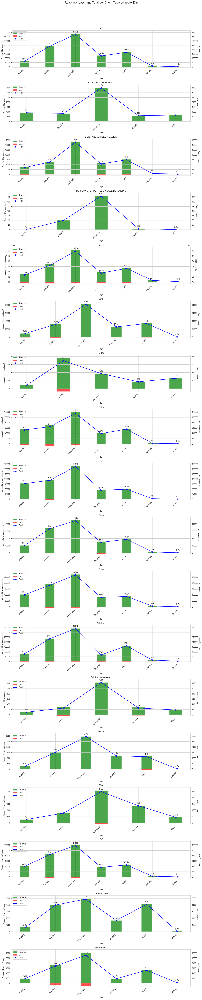

In [69]:
grouped = df.groupby(['day', 'product_category'])[['revenue', 'loss', 'total']].sum().reset_index()

day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
grouped['day'] = pd.Categorical(grouped['day'], categories=day_order, ordered=True)
grouped = grouped.sort_values('day')


categories =  grouped['product_category'].unique()

fig, axes = plt.subplots(len(categories), 1, figsize=(15, 4*len(categories)))
fig.suptitle(' Revenue, Loss, and Total per Client Type by Week Day', fontsize=16, y=1.02)

for i, category in enumerate(categories):
    category_data = grouped[grouped['product_category'] == category]
    
    ax = axes[i] if len(categories) > 1 else axes
    ax2 = ax.twinx()  
    
    x = range(len(category_data))
    ax.bar(x, category_data['revenue'], width=0.35, label='Revenue', color='g', alpha=0.7)
    ax.bar(x, category_data['loss'], width=0.35, label='Loss', color='r', alpha=0.7)
    
    line = ax2.plot(x, category_data['total'], color='b', marker='o', linestyle='-', linewidth=2, markersize=6, label='Total')
    
    for j, total in enumerate(category_data['total']):
        ax2.annotate(f'{total/1000:.1f}k', (x[j], total), textcoords="offset points", xytext=(0,10), ha='center')
    
    ax.set_title(f'{category}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Amount (Revenue/Loss)')
    ax2.set_ylabel('Amount (Total)')
    
    ax.set_xticks(x)
    ax.set_xticklabels(category_data['day'].astype(str), rotation=45, ha='right')
    
    ymin = min(category_data['loss'].min(), 0) 
    ymax = max(category_data['revenue'].max(), category_data['total'].max())
    ax.set_ylim(ymin * 1.1, ymax * 1.1)  
    ax2.set_ylim(ax.get_ylim())  
    
    
    ax.axhline(y=0, color='k', linestyle='-', linewidth=0.5)
    
    
    lines1, labels1 = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.tight_layout()
plt.show()

> Better views on https://public.tableau.com/app/profile/rob8544/viz/Salesperproductandclienttype/

### 4.2) Trends Seasonality and Forecast (answer for question 5)

In [70]:
print(df.head(3))

  transaction_date   client_id transaction_id  product_id  \
0       2024-06-28  f218bbcf08     576a451c59  fc56dbc6d4   
1       2024-06-28  f218bbcf08     576a451c59  fa2b7af0a8   
2       2024-06-28  f218bbcf08     576a451c59  a9b9bd8e0e   

                        product_name  price_vat  quantity     client_type  \
0    "CIGARE" HOEGAARDEN BLANCHE IFK       3.44      19.0  Bar Restaurant   
1    " CIGARE" ABBAYE LEFFE BLDE IFK       4.22      22.0  Bar Restaurant   
2  DOM. COUSSIN ROSE 23 CROIX PRIEUR       7.00       5.0  Bar Restaurant   

  product_category  total  revenue  loss     day  week    month  year  
0            Biere  65.36    65.36   0.0  Friday    26  2024-06  2024  
1            Biere  92.84    92.84   0.0  Friday    26  2024-06  2024  
2             Vins  35.00    35.00   0.0  Friday    26  2024-06  2024  


13:48:44 - cmdstanpy - INFO - Chain [1] start processing
13:48:45 - cmdstanpy - INFO - Chain [1] done processing
/Users/i0557807/opt/anaconda3/envs/ds/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(


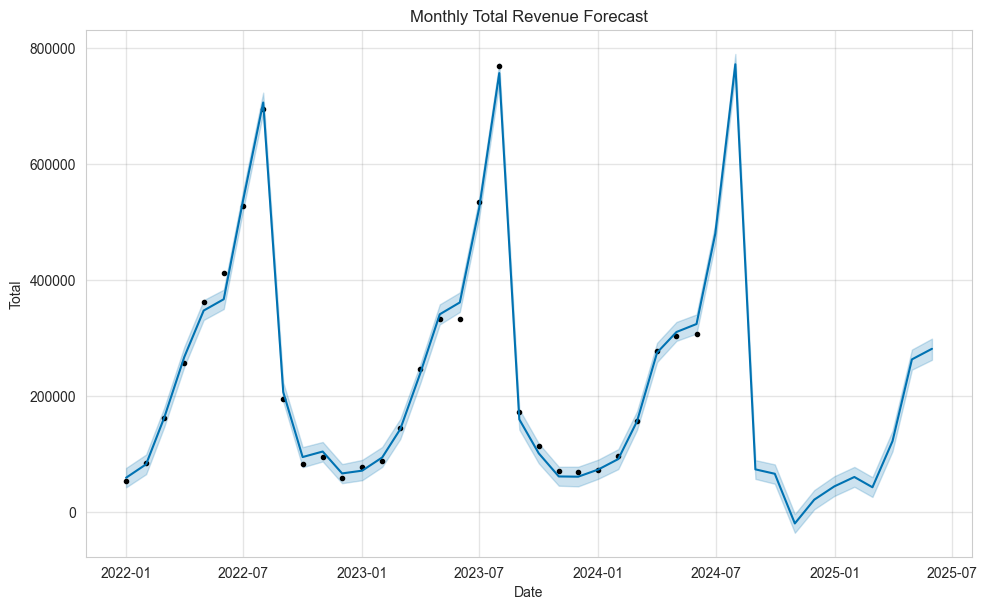

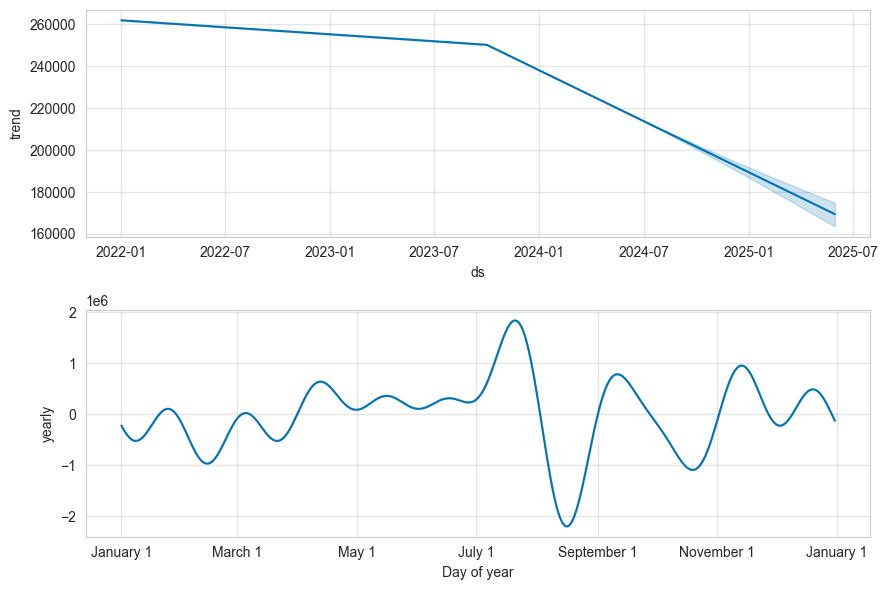

In [71]:
model = Prophet()

monthly_data = df.groupby('month')['total'].sum().reset_index()
monthly_data.columns = ['ds', 'y']
monthly_data['ds'] = monthly_data['ds'].dt.to_timestamp()
 

model = Prophet(yearly_seasonality=True)
model.fit(monthly_data)
 
future = model.make_future_dataframe(periods=12, freq='M')
forecast = model.predict(future)


fig1 = model.plot(forecast)
plt.title('Monthly Total Revenue Forecast')
plt.xlabel('Date')
plt.ylabel('Total')
plt.show()

fig2 = model.plot_components(forecast)
plt.show()
  

> The overall slope trend of total revenue is slightly negative.

# 3) Questions 

### __Question 1: Create a basic notebook to explore and visualize the data -- what are your main initial observations?__


#### About the data:

1. There are no information on the characteristics (products, clients or transactions)
1. With a bit of cleaning on the product name and using publicly available DB (such as world.openfoodfacts.org) one could get complementary information. For example: product features, global/local sales trends and so on.
1. There are 907 days of data.
1. 20 different type of clients (check comments on clients type)
1. There are 275 unique clients, with 1815 unique products*, within 18 categories*, for a total of 13199 transactions.
1. There is no information about the transaction type, ( buy or return) other than indicated by quantity sign (assumption).
1. Churn calculation or status is not defined.
> *Some could be grouped in the same category.

#### Within Cleaning data:

 1. There are duplicated values
 1. No missing values other than product_category, where the rows were filter out, since they dont bring relevant information to the study.
1. The product names could be cleanned further.

#### EDA:

- Price: 
    - The bulk of transactions (not revenue nor loss) is around 0.69-1 , 3.79-4.48 on price.
    - There are a lot of outliers.
- Quantity:
    - There do not seem to be an error to a particular category nor client.
    - We will assume that negative values are returns and adjustable accounting (assumption)
- Product category:
    - There is a limited amount of categories. Some could be better detailed/categorised, (sucre, nan/autres, Sirop)
- Product Name:
    - There is a whole work that could be done here, such as information gathering, such as : grouping product families by brand, or by type(martini rosse.. bianco), getting names and pairing information with external sources. 
    - This has been avoided due to the time.
- Client type:
    - Autres, N/S and Non codifies could be in the same category, as 'non informed'.
    - No real problem in here, the list is very short.
- Data Augmentation:
    - Dates could be transformed to periods, such as daily, weekly...etc.


> \>\>\>The best vizualizations are on https://public.tableau.com/app/profile/rob8544/viz/Salesperproductandclienttype/ <<<

 

### __Question 2: What are the top 5 most popular products by revenue?__


In [72]:
#with returns included
top5_total_income_products = df.groupby('product_name')['total'].sum().sort_values(ascending=False).head(5).index.tolist()
print("Top 5 products with returns included = ",top5_total_income_products )

Top 5 products with returns included =  ['GRIMBERGEN BLONDE', '1664', 'COCA COLA', 'AMBAR BLONDE', 'KRONENBOURG EXPORT']


### __Question 3 : How is revenue distributed across different customer segments?__


a) Please refer to : point 4.2 (Answer) Question 3, How is revenue distrubited across different customer segments? 

b) For a more comprehensive cluster of clients using ML: 

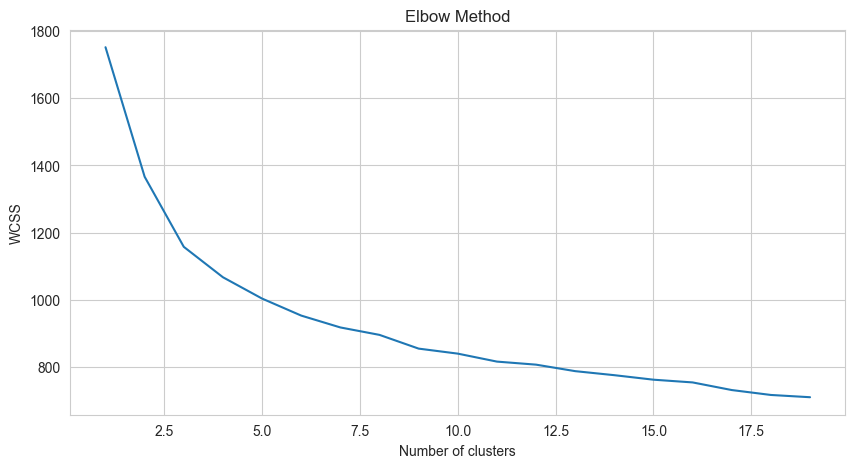

In [73]:
# Clustering clients by revenue using KMeans

client_data = df.groupby('client_id').agg({
    'revenue': ['sum', 'mean'],
    'product_id':lambda x: x.mode().iloc[0],
    'transaction_id': 'count',
    'product_category': lambda x: x.mode().iloc[0],
    'client_type': 'first',
    'month': lambda x: x.mode().iloc[0]   
})

client_data.columns = ['total_revenue', 'avg_revenue','most_common_product' ,'transaction_count', 
                       'most_common_category', 'client_type', 'most_common_month']

client_data = pd.get_dummies(client_data, columns=['most_common_product','most_common_category', 'client_type', 'most_common_month'])

scaler = StandardScaler()
numerical_features = ['total_revenue', 'avg_revenue', 'transaction_count']
client_data[numerical_features] = scaler.fit_transform(client_data[numerical_features])


#Start
wcss=[]
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(client_data)
    wcss.append(kmeans.inertia_)

# Plot the elbow graph
plt.figure(figsize=(10,5))
plt.plot(range(1, 20), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

n_clusters = 4  
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(client_data)
client_data['Cluster'] = clusters
 
client_data.reset_index(inplace=True)


>  The right amount of clusters is from 3 to 7.  We choose 4 since the good elbow is between 3 or 5.

In [74]:
client_data.head(3)

,client_id,total_revenue,avg_revenue,transaction_count,most_common_product_01d54579da,most_common_product_023849c389,most_common_product_04a8708c3a,most_common_product_062f50753b,most_common_product_06b2d82840,most_common_product_0788979fc9,...,most_common_month_2023-10,most_common_month_2023-11,most_common_month_2023-12,most_common_month_2024-01,most_common_month_2024-02,most_common_month_2024-03,most_common_month_2024-04,most_common_month_2024-05,most_common_month_2024-06,Cluster
0,00185f50ae,0.837381,-0.344703,1.181426,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,2
1,0056ab1de2,-0.454220,-0.311488,-0.453950,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,0
2,0180a6384d,-0.533249,-0.538944,-0.402402,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,0


In [75]:
# CHECK:  Any client has more than one cluster?
(client_data.groupby(['client_id']).Cluster.value_counts()>1).any()

np.False_

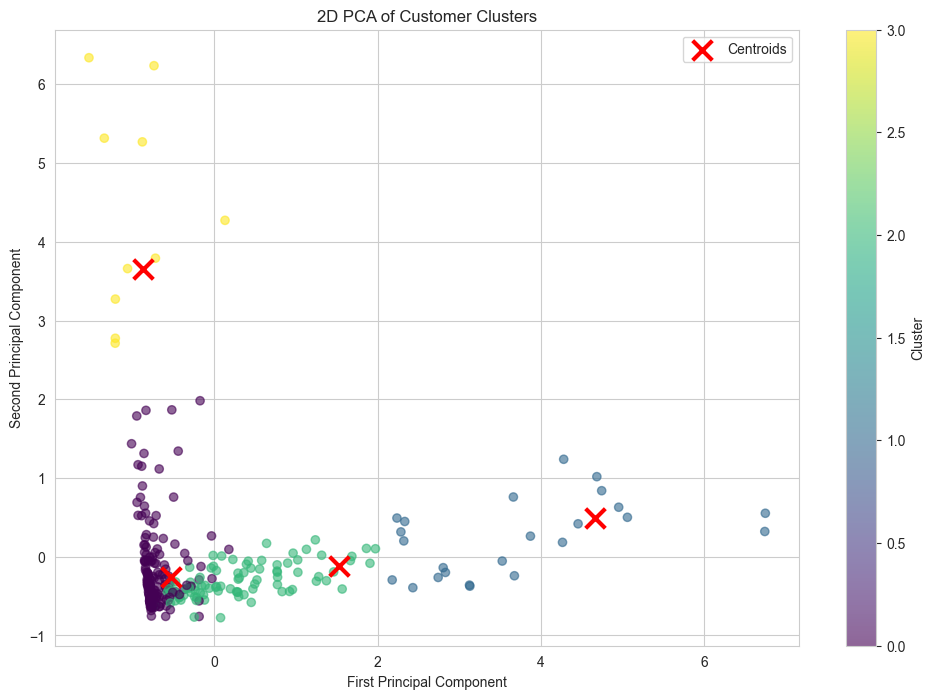

Explained variance ratio: [0.61936702 0.33553354]
Total explained variance: 0.9549005630240064


In [76]:
# Lets visualize the groups in 2Dimensions using PCA 

numeric_columns = ['total_revenue', 'avg_revenue', 'transaction_count' ]
 
 
# Perform PCA on numeric data only
pca = PCA(n_components=2)
principal_components = pca.fit_transform(client_data[numeric_columns])
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['Cluster'] = client_data['Cluster']

#  2D scatter plot
plt.figure(figsize=(12,8))
scatter = plt.scatter(pca_df['PC1'], pca_df['PC2'], c=pca_df['Cluster'], cmap='viridis', alpha=0.6)
plt.title('2D PCA of Customer Clusters')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.colorbar(scatter, label='Cluster')

#centroids
kmeans = KMeans(n_clusters=len(pca_df['Cluster'].unique()), random_state=42)
kmeans.fit(pca_df[['PC1', 'PC2']])
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=200, linewidths=3, label='Centroids')
plt.legend()

plt.show()
 
print("Explained variance ratio:", pca.explained_variance_ratio_)
print("Total explained variance:", sum(pca.explained_variance_ratio_))


> The variance explained is high, thus the PCA is showing in 2D a good amount of information, and thus allowing us to verify visually if the clusters make sense

### __Question 4 : Can you detect any outliers in the price column? How would you handle these outliers?__

>The visualization for this question has been seen in the EDA of price section 'outliers' (point 2.2 Price - (B) Outliers)

1) Using the standard IQR method we can see many outliers, the best is divide by  client type and product_category, otherwise the outliers will be not relevant.
2) If required, a more deeper outlier separation could be done, if we would get more item-related information out of the product names and an external database to complement the item information (such as level alcohol, components list, presentation, volume..etc).
3) If we want an anomaly detection of outliers we could apply an isolation forest model for future new points classification.


### __Question 5 : What seasonal patterns can you identify and what might be the reason for this seasonality?__ 

   >The visualization for this questions has been seen in  'Trends Seasonality and Forecast' (point 4. )

1) The trend is slightly goind down
2) There seems to be a strong recurrent additive seasonality.


### __Question 6 : Have there been any significant shifts in consumption affecting the business in 2023 vs 2022 and how?__

In [77]:
# %increase in 
print("Pct. change in transactions = ",df[df.year != '2024'].groupby(['year']).transaction_id.nunique().pct_change().round(4).iloc[1]*100 ,"%")
print("Pct. change in quantity = ",df[df.year != '2024'].groupby(['year']).quantity.sum().pct_change().round(4).iloc[1]*100 ,"%")
print("Pct. change in Total revenue = ",df[df.year != '2024'].groupby(['year']).total.sum().pct_change().round(4).iloc[1]*100 ,"%")

print("Pct. change in Total revenue = ",df[df.year != '2024'].groupby(['year','product_category']).total.sum().pct_change().round(4).iloc[1]*100 ,"%")


Pct. change in transactions =  -3.54 %
Pct. change in quantity =  -6.93 %
Pct. change in Total revenue =  -1.09 %
Pct. change in Total revenue =  -39.6 %


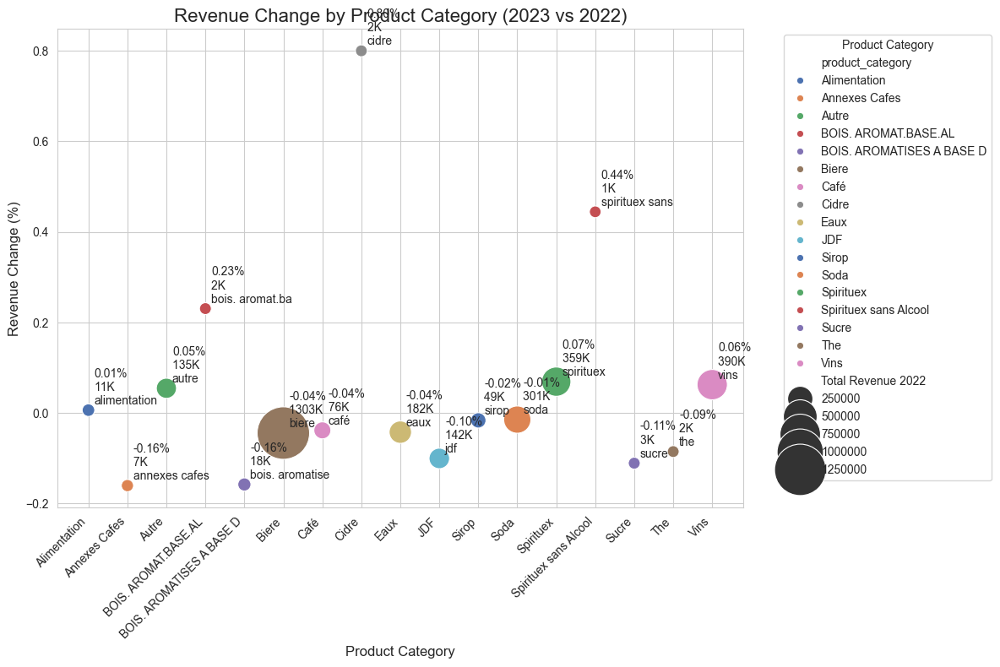

In [78]:
data = df[(df.year == '2022')|(df.year =='2023')].groupby(['year', 'product_category'])['total'].sum().unstack(level=0).pct_change(axis=1).round(4).reset_index()
data.columns = ['product_category','y_2022','change_2023' ]
 

# Calculate total revenue for sizing the points
total_revenue = df[df.year == '2022'].groupby('product_category')['total'].sum().reset_index()
data = pd.merge(data, total_revenue, on='product_category')
data.columns = ['product_category','y_2022','change_2023','Total Revenue 2022' ]
 
# Create the scatter plot
plt.figure(figsize=(12, 8))
sns.set_style("whitegrid")

scatter = sns.scatterplot(
    data=data,
    x='product_category',
    y='change_2023',
    size='Total Revenue 2022',
    sizes=(100, 2000),   
    hue='product_category',
    palette='deep'
)
 
plt.title('Revenue Change by Product Category (2023 vs 2022)', fontsize=16)
plt.xlabel('Product Category', fontsize=12)
plt.ylabel('Revenue Change (%)', fontsize=12)
plt.xticks(rotation=45, ha='right')
 
for i, row in data.iterrows():
    plt.annotate(f"{row['change_2023']:.2f}%\n{row['Total Revenue 2022']/1000:.0f}K \n{row['product_category'].lower()[:15]}",
                 (i, row['change_2023']),
                 xytext=(5, 5), 
                 textcoords='offset points')
 
plt.legend(title='Product Category', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

> The size explains the total Revenue of 2022. 

> The percentage is the percentage of change from 2022-> 2023

> We can appriciate that while many products increased revenue sales (example +44,43% in spiriteux sans Alcool, or  + 79,98% in Cidre) the biggest amount of revenue lost, came from Biere, Eux and   JDK

### __Question 7: For each client, calculate Dropped products [Product name, Total lost revenue, Total lost quantity] for June 2024:__

##### __ASSUMPTIONS:__

- Period : In the last 6 months. (from  '2023-12-30' until '2024-06-30' )
- Definition: dropped products = products that were once bought and no are longer bought.
- Churn:  loss of customers revenue, quantity or variaty over a specific period of time.

In [120]:
# Periods creation
end_date = pd.to_datetime('2024-06-30')
start_date = end_date - pd.DateOffset(months=6)
previous_start_date = start_date - pd.DateOffset(months=6)

# Cohorts creation
current_period = df[(df.transaction_date > start_date) & (df.transaction_date <= end_date)]
previous_period = df[(df.transaction_date > previous_start_date) & (df.transaction_date <= start_date)]

previous_start_date, start_date, end_date

(Timestamp('2023-06-30 00:00:00'),
 Timestamp('2023-12-30 00:00:00'),
 Timestamp('2024-06-30 00:00:00'))

In [121]:
current_period.head(3)

,transaction_date,client_id,transaction_id,product_id,product_name,price_vat,quantity,client_type,product_category,total,revenue,loss,day,week,month,year
0,2024-06-28,f218bbcf08,576a451c59,fc56dbc6d4,"""CIGARE"" HOEGAARDEN BLANCHE IFK",3.44,19.0,Bar Restaurant,Biere,65.36,65.36,0.0,Friday,26,2024-06,2024
1,2024-06-28,f218bbcf08,576a451c59,fa2b7af0a8,""" CIGARE"" ABBAYE LEFFE BLDE IFK",4.22,22.0,Bar Restaurant,Biere,92.84,92.84,0.0,Friday,26,2024-06,2024
2,2024-06-28,f218bbcf08,576a451c59,a9b9bd8e0e,DOM. COUSSIN ROSE 23 CROIX PRIEUR,7.00,5.0,Bar Restaurant,Vins,35.00,35.00,0.0,Friday,26,2024-06,2024


#### Dropped products [Product name, Total lost revenue, Total lost quantity]

In [122]:
cols_of_interest = ['client_id','transaction_id','product_id','product_name', 'quantity', 'total','revenue','loss']

current_period  = current_period[cols_of_interest]
previous_period = previous_period[cols_of_interest]

>We dont need to keep the price_vat as is already in Total, Revenue and in Loss.

>Since there is 1 to 1 on  product_id/name we only need one, but for aestethics we keep both.

In [123]:
current_period.head(3)

,client_id,transaction_id,product_id,product_name,price_vat,quantity,total,revenue,loss
0,f218bbcf08,576a451c59,fc56dbc6d4,"""CIGARE"" HOEGAARDEN BLANCHE IFK",3.44,19.0,65.36,65.36,0.0
1,f218bbcf08,576a451c59,fa2b7af0a8,""" CIGARE"" ABBAYE LEFFE BLDE IFK",4.22,22.0,92.84,92.84,0.0
2,f218bbcf08,576a451c59,a9b9bd8e0e,DOM. COUSSIN ROSE 23 CROIX PRIEUR,7.00,5.0,35.00,35.00,0.0


In [124]:
curr = current_period.groupby(['client_id','product_id','product_name' ]).agg({'quantity':'sum','total':'sum','revenue':'sum','loss':'sum'}).reset_index()
prev = previous_period.groupby(['client_id','product_id','product_name' ]).agg({'quantity':'sum','total':'sum','revenue':'sum','loss':'sum'}).reset_index()
curr.head(3)

,client_id,product_id,product_name,quantity,total,revenue,loss
0,00185f50ae,00328ce57b,LE LOUVETIER ROSE BX AOP,6.0,36.66,36.66,0.0
1,00185f50ae,058d5d43bf,PAGO ABC PAMPLEMOUSSE ROSE,12.0,11.76,11.76,0.0
2,00185f50ae,064c3e311e,GRD MARNIER ROUGE,1.0,21.29,21.29,0.0


In [128]:
drop = prev.merge(curr, on=['client_id','product_id','product_name'], how='left',indicator=True,suffixes=('_prev','_after'))
drop.head(3)

,client_id,product_id,product_name,quantity_prev,total_prev,revenue_prev,loss_prev,quantity_after,total_after,revenue_after,loss_after,_merge
0,00185f50ae,00328ce57b,LE LOUVETIER ROSE BX AOP,12.0,72.18,72.18,0.0,6.0,36.66,36.66,0.0,both
1,00185f50ae,058d5d43bf,PAGO ABC PAMPLEMOUSSE ROSE,22.0,20.90,20.90,0.0,12.0,11.76,11.76,0.0,both
2,00185f50ae,064c3e311e,GRD MARNIER ROUGE,2.0,36.19,36.19,0.0,1.0,21.29,21.29,0.0,both


In [133]:
drop[drop._merge == 'left_only'].groupby(['client_id','product_id','product_name'])\
.agg({'quantity_prev':'sum','total_prev':'sum','revenue_prev':'sum','loss_prev':'sum'})\
.rename(columns={
    'quantity_prev': 'loss_quantity',
    'total_prev': 'total_loss',
    'revenue_prev': 'loss_positive_revenue',
    'loss_prev': 'previous_returns'
})

loss_quantity  \
client_id  product_id product_name                                       
00185f50ae 10e4e7caf8 GET 27                                       1.0   
           303c8bd558 BAILEYS IRISH CREAM                          5.0   
           3635a91e3d CHAMPAGNE BRUT VVE RENARD AUTREAU            6.0   
           4a30a219a9 GET 31 PIPPERMINT                            1.0   
           748064be03 PAGO TROPICAL 100% ABC                     105.0   
...                                                                ...   
fbeb3d5f8b 98f1f17f9a PASTIS 51                                    2.0   
           9f006addc8 DUVEL                                       28.0   
           ad8fa913d2 CHT BORIE DE NOAILLAN RGE                    8.0   
           b4944c6ff0 SIROP FUEGO VIOLETTE                         3.0   
fc3cf8aab4 0cce0bd361 GOTHIC BLONDE M                            157.0   

                                                         total_loss  \
client_id  product_id product_name                                    
00185f50ae 10e4e7caf8 GET 27                                  13.67   
           303c8bd558 BAILEYS IRISH CREAM                     74.00   
           3635a91e3d CHAMPAGNE BRUT VVE RENARD AUTREAU       99.78   
           4a30a219a9 GET 31 PIPPERMINT                       14.48   
           748064be03 PAGO TROPICAL 100% ABC                  88.48   
...                                                             ...   
fbeb3d5f8b 98f1f17f9a PASTIS 51                               18.64   
           9f006addc8 DUVEL                                   40.12   
           ad8fa913d2 CHT BORIE DE NOAILLAN RGE               26.78   
           b4944c6ff0 SIROP FUEGO VIOLETTE                    25.77   
fc3cf8aab4 0cce0bd361 GOTHIC BLONDE M                        305.03   

                                                         loss_positive_revenue  \
client_id  product_id product_name                                               
00185f50ae 10e4e7caf8 GET 27                                             13.67   
           303c8bd558 BAILEYS IRISH CREAM                                74.00   
           3635a91e3d CHAMPAGNE BRUT VVE RENARD AUTREAU                  99.78   
           4a30a219a9 GET 31 PIPPERMINT                                  14.48   
           748064be03 PAGO TROPICAL 100% ABC                             88.48   
...                                                                        ...   
fbeb3d5f8b 98f1f17f9a PASTIS 51                                          18.64   
           9f006addc8 DUVEL                                              74.00   
           ad8fa913d2 CHT BORIE DE NOAILLAN RGE                         104.00   
           b4944c6ff0 SIROP FUEGO VIOLETTE                               25.77   
fc3cf8aab4 0cce0bd361 GOTHIC BLONDE M                                   360.42   

                                                         previous_returns  
client_id  product_id product_name                                         
00185f50ae 10e4e7caf8 GET 27                                         0.00  
           303c8bd558 BAILEYS IRISH CREAM                            0.00  
           3635a91e3d CHAMPAGNE BRUT VVE RENARD AUTREAU              0.00  
           4a30a219a9 GET 31 PIPPERMINT                              0.00  
           748064be03 PAGO TROPICAL 100% ABC                         0.00  
...                                                                   ...  
fbeb3d5f8b 98f1f17f9a PASTIS 51                                      0.00  
           9f006addc8 DUVEL                                        -33.88  
           ad8fa913d2 CHT BORIE DE NOAILLAN RGE                    -77.22  
           b4944c6ff0 SIROP FUEGO VIOLETTE                           0.00  
fc3cf8aab4 0cce0bd361 GOTHIC BLONDE M                              -55.39  

[3090 rows x 4 columns]

#### Possible Churners

There is no global definition of churn thus this is the definition:

`A customer who stops using a company's product or service`

For this I believe that a churner must have one of these "signals":

- loss of interest: decrease in product quantity
- loss of intensity: decrease in total revenue
- increase of disagreement: increase in returns (loss)
- stop of usage: no transactions

There could me more signals to add but as a preliminary use these are more than enough.


We will calculate this for each user and  


In [81]:



current= df[current_period].groupby('client_id').agg({'total':'sum','quantity':'sum','revenue':'sum','loss':'sum','product_id':['count','nunique'],'transaction_id':['nunique','count']}).reset_index()
current.columns=['client_id','total_revenue','quantity','revenue','loss','product_count','unique_product_count','unique_transaction_count','transaction_counts']
current.head(3)



,client_id,total_revenue,quantity,revenue,loss,product_count,unique_product_count,unique_transaction_count,transaction_counts
0,00185f50ae,10330.12,4183.0,10335.34,-5.22,224,87,17,224
1,0180a6384d,1108.16,602.0,1127.85,-19.69,51,22,8,51
2,018c0a68dc,141.76,26.0,141.76,0.00,3,3,1,3


In [82]:
previous= df[previous_period].groupby('client_id').agg({'total':'sum','quantity':'sum','revenue':'sum','loss':'sum','product_id':['count','nunique'],'transaction_id':['nunique','count']}).reset_index()
previous.columns=['client_id','total_revenue','quantity','revenue','loss','product_count','unique_product_count','unique_transaction_count','transaction_counts']
previous.head(3)

,client_id,total_revenue,quantity,revenue,loss,product_count,unique_product_count,unique_transaction_count,transaction_counts
0,00185f50ae,14018.77,8115.0,14996.97,-978.20,305,75,16,305
1,0198eac10e,13429.87,5782.0,13474.48,-44.61,145,36,23,145
2,05dd6d0152,73.22,73.0,73.22,0.00,3,2,3,3


In [91]:
merged = current.merge(previous, on='client_id', how='left',validate='1:1',suffixes=('_curr', '_prev'))
merged.head(3)

,client_id,total_revenue_curr,quantity_curr,revenue_curr,loss_curr,product_count_curr,unique_product_count_curr,unique_transaction_count_curr,transaction_counts_curr,total_revenue_prev,quantity_prev,revenue_prev,loss_prev,product_count_prev,unique_product_count_prev,unique_transaction_count_prev,transaction_counts_prev
0,00185f50ae,10330.12,4183.0,10335.34,-5.22,224,87,17,224,14018.77,8115.0,14996.97,-978.2,305.0,75.0,16.0,305.0
1,0180a6384d,1108.16,602.0,1127.85,-19.69,51,22,8,51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,018c0a68dc,141.76,26.0,141.76,0.00,3,3,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [92]:
# States creation
cols = ['total_revenue','quantity','revenue','loss','product_count','unique_product_count','unique_transaction_count','transaction_counts']
for col in cols:
  merged['pct_change_'+col] = np.where(merged[col+'_prev'] == 0, 0, 
                              ((merged[col+'_curr'] - merged[col+'_prev']) / merged[col+'_prev']) * 100)


In [93]:
ordered_columns = 
merged

,client_id,total_revenue_curr,quantity_curr,revenue_curr,loss_curr,product_count_curr,unique_product_count_curr,unique_transaction_count_curr,transaction_counts_curr,total_revenue_prev,...,unique_transaction_count_prev,transaction_counts_prev,pct_change_total_revenue,pct_change_quantity,pct_change_revenue,pct_change_loss,pct_change_product_count,pct_change_unique_product_count,pct_change_unique_transaction_count,pct_change_transaction_counts
0,00185f50ae,10330.12,4183.0,10335.34,-5.22,224,87,17,224,14018.77,...,16.0,305.0,-26.312223,-48.453481,-31.083812,-99.466367,-26.557377,16.000000,6.250000,-26.557377
1,0180a6384d,1108.16,602.0,1127.85,-19.69,51,22,8,51,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,018c0a68dc,141.76,26.0,141.76,0.00,3,3,1,3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0198eac10e,9349.43,3875.0,10009.31,-659.88,191,62,21,191,13429.87,...,23.0,145.0,-30.383317,-32.981667,-25.716540,1379.219906,31.724138,72.222222,-8.695652,31.724138
4,029f08dafa,107.22,57.0,204.57,-97.35,3,2,2,3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188,f40f20a715,710.63,397.0,710.63,0.00,5,2,4,5,212.86,...,2.0,3.0,233.848539,346.067416,233.848539,0.000000,66.666667,0.000000,100.000000,66.666667
189,f5b4fcce63,11758.06,3760.0,11781.62,-23.56,300,40,26,300,9906.90,...,25.0,262.0,18.685563,3.211639,18.923377,0.000000,14.503817,5.263158,4.000000,14.503817
190,f7cf61c962,2706.95,1347.0,3333.45,-626.50,6,3,3,6,5694.73,...,4.0,10.0,-52.465701,-59.886837,-48.653511,-21.426242,-40.000000,-25.000000,-25.000000,-40.000000
191,fbeb3d5f8b,19198.84,7778.0,19616.73,-417.89,248,89,22,248,19207.87,...,37.0,262.0,-0.047012,-12.251805,-5.422572,-72.750688,-5.343511,36.923077,-40.540541,-5.343511


In [96]:
from sklearn.ensemble import IsolationForest
import numpy as np

# Sample data
X = np.array([[1], [2], [3], [4], [5], [100]])

# Initialize the Isolation Forest
clf = IsolationForest(contamination=0.05, random_state=42)

# Fit the model
clf.fit(X)

# Predict anomalies (-1 means anomaly, 1 means normal)
predictions = clf.predict(X)

# Display predictions
print(predictions)


[ 1  1  1  1  1 -1]


aa

---
---
---

# Annexes

 This is only for thoughts a side.


### Ideas for each column

transaction_id: 
- grouping products basket
- user purchase volume per time 
- like of a product (purchased again from another time in past)


price :
- fluctuation
- 
